In [1]:
import ast
import pandas as pd
import json
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.dates as mdates


# Set global font size using rcParams
plt.rcParams.update({
    'font.size': 18,  # General font size
    'axes.titlesize': 20,  # Title font size
    'axes.labelsize': 18,  # Axis label font size
    'xtick.labelsize': 16,  # X-axis tick label size
    'ytick.labelsize': 16,  # Y-axis tick label size
    'legend.fontsize': 16,  # Legend font size
    'figure.titlesize': 22  # Overall figure title size (if used)
})


<jemalloc>: MADV_DONTNEED does not work (memset will be used instead)
<jemalloc>: (This is the expected behaviour if you are running under QEMU)


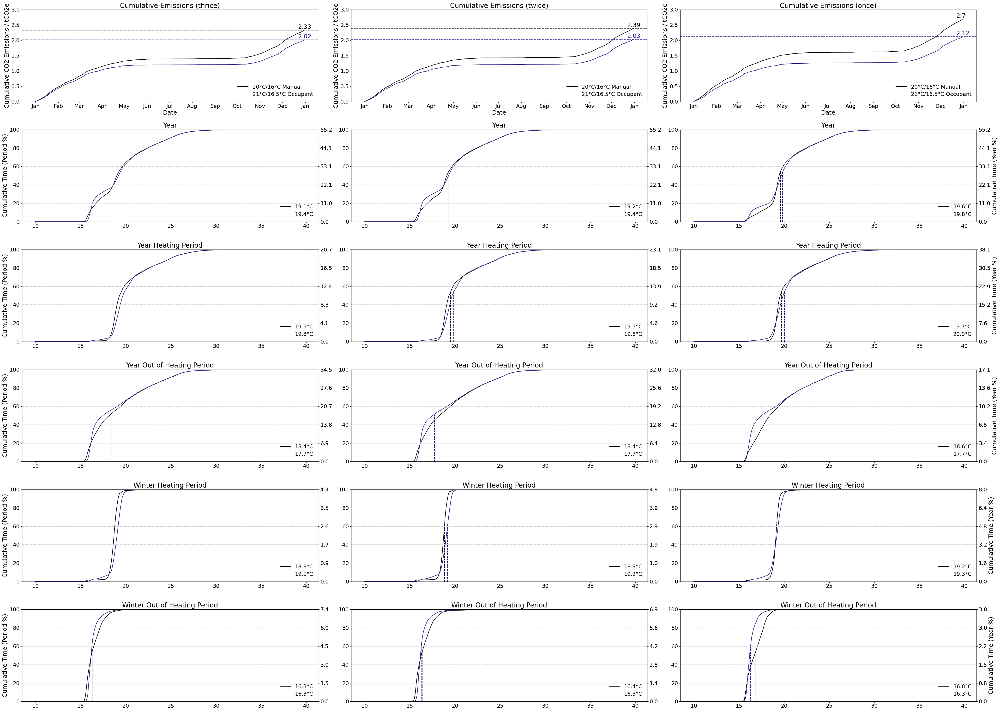

In [2]:

room_areas = {'Frontroom': 14.04,
              'Kitchen': 11.34,
              'Backroom': 11.34,
              'Hall (Downstairs)': 7.02,
              'Bedroom 1': 11.51,
              'Bedroom 2': 12.39,
              'Bedroom 3': 6.86,
              'Bathroom': 7.105,
              'Hall (Upstairs)': 5.88}

total_floor_area = sum(room_areas.values())

rooms = {
    'Frontroom': ('Zone People Occupant Count(front_room)', 'Zone Operative Temperature(front_room)', 'Zone Air Temperature(front_room)'),
    'Backroom': ('Zone People Occupant Count(backroom)', 'Zone Operative Temperature(backroom)', 'Zone Air Temperature(backroom)'),
    'Kitchen': ('Zone People Occupant Count(kitchen)', 'Zone Operative Temperature(kitchen)', 'Zone Air Temperature(kitchen)'),
    'Hall (Downstairs)': ('Zone People Occupant Count(hall_downstairs)', 'Zone Operative Temperature(hall_downstairs)', 'Zone Air Temperature(hall_downstairs)'),
    'Bedroom 1': ('Zone People Occupant Count(bedroom_1)', 'Zone Operative Temperature(bedroom_1)', 'Zone Air Temperature(bedroom_1)'),
    'Bedroom 2': ('Zone People Occupant Count(bedroom_2)', 'Zone Operative Temperature(bedroom_2)', 'Zone Air Temperature(bedroom_2)'),
    'Bedroom 3': ('Zone People Occupant Count(bedroom_3)', 'Zone Operative Temperature(bedroom_3)', 'Zone Air Temperature(bedroom_3)'),
    'Bathroom': ('Zone People Occupant Count(bathroom)', 'Zone Operative Temperature(bathroom)', 'Zone Air Temperature(bathroom)'),
    'Hall (Upstairs)': ('Zone People Occupant Count(hall_upstairs)', 'Zone Operative Temperature(hall_upstairs)', 'Zone Air Temperature(hall_upstairs)')
}



def segment_data(manual_monitor,comparison_monitor, heating_pattern):

    def filter_by_time_range(monitor_data, start_hour=None, end_hour=None):
        if start_hour is not None and end_hour is not None:
            return monitor_data[(monitor_data.index.hour >= start_hour) & (monitor_data.index.hour < end_hour)]
        else:
            return monitor_data  # Return all data if no time range is specified

    # Define your heating patterns
    heating_patterns = {
        'once': [(6, 23)],  # Heating once from 06:00 to 23:00
        'twice': [(6, 9), (16, 23)],  # Heating twice: 06:00-09:00, 16:00-23:00
        'thrice': [(6, 8), (12, 14), (18, 23)]  # Heating thrice: 06:00-08:00, 12:00-14:00, 18:00-23:00
    }

    # Get the time ranges for the selected heating pattern
    time_ranges = heating_patterns[heating_pattern]

    # List of monitors (winter and year)
    monitors_year = [manual_monitor,
                    comparison_monitor,]

    monitors_winter = [manual_monitor,
                    comparison_monitor,]

    # Ensure the index is in datetime format for each monitor (both winter and year)
    for i in range(len(monitors_winter)):
        monitors_winter[i].index = pd.to_datetime(monitors_winter[i].index)
        monitors_winter[i] = monitors_winter[i].loc[:'2013-03-31 23:59:59']  # Apply date range filter

    for i in range(len(monitors_year)):
        monitors_year[i].index = pd.to_datetime(monitors_year[i].index)

    # Function to filter by dynamic time ranges (for heating periods)
    def filter_by_time_ranges(monitor, time_ranges):
        time_slices = [filter_by_time_range(monitor, start, end) for start, end in time_ranges]
        return pd.concat(time_slices).sort_index()

    # Apply dynamic time slicing for heating period
    monitors_winter_heating_period = [filter_by_time_ranges(monitor, time_ranges) for monitor in monitors_winter]
    monitors_year_heating_period = [filter_by_time_ranges(monitor, time_ranges) for monitor in monitors_year]

    # Slicing time **out of heating period** (excluding heating hours and sleep hours)
    def filter_out_of_heating_period_and_sleep(monitor, time_ranges):
        # Condition to filter out heating hours
        condition = pd.Series([True] * len(monitor), index=monitor.index)
        for start, end in time_ranges:
            condition &= ~((monitor.index.hour >= start) & (monitor.index.hour < end))

        # Exclude sleep hours (23:00 - 06:00)
        #condition &= ~((monitor.index.hour >= 23) | (monitor.index.hour < 6))

        return monitor.loc[condition]

    # Apply dynamic time slicing for out-of-heating period, also excluding sleep hours
    monitors_winter_out_of_heating_period = [
        filter_out_of_heating_period_and_sleep(monitor, time_ranges) for monitor in monitors_winter
    ]
    monitors_year_out_of_heating_period = [
        filter_out_of_heating_period_and_sleep(monitor, time_ranges) for monitor in monitors_year
    ]

    monitors_list = [
        monitors_year,
        monitors_year_heating_period,
        monitors_year_out_of_heating_period,
        monitors_winter_heating_period,
        monitors_winter_out_of_heating_period,
    ]

    labels = [
        'Year',
        'Year Heating Period',
        'Year Out of Heating Period',
        'Winter Heating Period',
        'Winter Out of Heating Period',
    ]

    return monitors_list, labels


def plot_multiple_rows(monitors_list, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names, labels, axes, col_idx, num_cols):
    total_minutes_in_year = 525600  # Total minutes in a year

    # Calculate total occupied minutes for each monitor
    def calculate_total_occupied_minutes(monitors_condensed, rooms):
        total_occupied_minutes_per_monitor = []
        for monitor in monitors_condensed:
            total_occupied = 0
            for room, (occupant_count_col, _, _) in rooms.items():
                total_occupied += (monitor[occupant_count_col] > 0).sum()
            total_occupied_minutes_per_monitor.append(total_occupied)
        return total_occupied_minutes_per_monitor

    # Calculate weighted totals for the cumulative plot
    def calculate_weighted_totals(total_occupied_minutes, monitors_condensed):
        weighted_counts_op = [np.zeros(len(bin_edges) - 1) for _ in range(len(monitors_condensed))]
        combined_op_monitor = [[] for _ in range(len(monitors_condensed))]

        for room, (occupant_count_col, op_temp_col, air_temp_col) in rooms.items():
            room_area_weight = room_areas[room] / total_floor_area

            for i, monitor in enumerate(monitors_condensed):
                filtered_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]
                counts_op, bins = np.histogram(filtered_op_temps, bins=bin_edges)
                counts_percentage_op = np.cumsum((counts_op / counts_op.sum()) * 100)

                weighted_counts_op[i] += counts_percentage_op * room_area_weight
                combined_op_monitor[i].extend(filtered_op_temps)

        return weighted_counts_op, combined_op_monitor

    # Plot the cumulative totals for all rooms
    def plot_combined_room(ax, weighted_counts_op, combined_op_monitor, total_occupied_minutes_per_monitor, is_leftmost, is_rightmost):
        medians_op_monitor = [np.median(combined_op) for combined_op in combined_op_monitor]

        ax.set_ylim(0, 100)

        # Plot the weighted cumulative distributions for both monitors
        for i in range(2):  # Assuming two monitors (manual and comparison)
            normalisation = total_occupied_minutes_per_monitor[i] / total_minutes_in_year

            ax.plot(bin_edges[:-1], weighted_counts_op[i], linestyle='-', color=run_colours[i], label=f'{medians_op_monitor[i]:.1f}°C')
            y_median = np.interp(medians_op_monitor[i], bin_edges[:-1], weighted_counts_op[i])
            ax.plot([medians_op_monitor[i], medians_op_monitor[i]], [0, y_median], color=run_colours[i], linestyle='--')

            # Add faint horizontal lines at 20, 40, 60, 80
            for y in [20, 40, 60, 80]:
                ax.axhline(y=y, color='lightgray', linestyle='--')

            ax2 = ax.twinx()
            ax2.set_ylim(0, 100)
            secax_ticks = ax.get_yticks()
            ax2_ticks = secax_ticks * normalisation
            ax2.set_yticks(secax_ticks)
            ax2.set_yticklabels([f'{tick * normalisation:.1f}' for tick in secax_ticks])

            # Only set the secondary y-axis label on the rightmost column
            if is_rightmost:
                ax2.set_ylabel('Cumulative Time (Year %)')

        # Only set the primary y-axis label on the leftmost column
        if is_leftmost:
            ax.set_ylabel('Cumulative Time (Period %)')
        ax.legend(loc='lower right', frameon=False)

    # Loop over each monitor set and plot on the corresponding row
    for idx, monitor_set in enumerate(monitors_list):
        total_occupied_minutes_per_monitor = calculate_total_occupied_minutes(monitor_set, rooms)
        weighted_counts_op, combined_op_monitor = calculate_weighted_totals(total_occupied_minutes_per_monitor, monitor_set)

        # Check if the current subplot is the leftmost column or rightmost column
        is_leftmost = col_idx == 0
        is_rightmost = col_idx == num_cols - 1

        plot_combined_room(axes[idx], weighted_counts_op, combined_op_monitor, total_occupied_minutes_per_monitor, is_leftmost, is_rightmost)
        axes[idx].set_title(f'{labels[idx]}')



def plot_all_heating_patterns_in_columns(heating_patterns, comparison_file_name, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names):
    total_rows_per_pattern = 6  # 1 row for emissions, 5 rows for temperatures
    num_patterns = len(heating_patterns)

    fig, axes = plt.subplots(total_rows_per_pattern, num_patterns, figsize=(14 * num_patterns, total_rows_per_pattern * 5))

    num_cols = len(heating_patterns)  # Assuming each heating pattern is a column
    for col, heating_pattern in enumerate(heating_patterns):
        manual_monitor_path = f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone0_monitor_condensed.csv"
        comparison_monitor_path = f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/{comparison_file_name}.csv"

        manual_monitor = pd.read_csv(manual_monitor_path, index_col=0)
        comparison_monitor = pd.read_csv(comparison_monitor_path, index_col=0)

        monitors_list, labels = segment_data(manual_monitor, comparison_monitor, heating_pattern)

        # Plot cumulative emissions for this heating pattern (first row, corresponding column)
        co2_emissions_zone0 = manual_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()
        co2_emissions_zone9 = comparison_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()

        co2_emissions_zone0.index = pd.to_datetime(co2_emissions_zone0.index)
        co2_emissions_zone9.index = pd.to_datetime(co2_emissions_zone9.index)
        co2_emissions_zone0 /= 1000
        co2_emissions_zone9 /= 1000

        cumulative_co2_zone0 = co2_emissions_zone0.resample('D').sum().cumsum()
        cumulative_co2_zone9 = co2_emissions_zone9.resample('D').sum().cumsum()

        # Calculate total sums for each dataset (in tonnes)
        total_co2_zone0 = co2_emissions_zone0.sum()
        total_co2_zone9 = co2_emissions_zone9.sum()

        # Plot cumulative emissions
        sns.lineplot(x=cumulative_co2_zone0.index, y=cumulative_co2_zone0, label=f'{run_names.get(0)}', color=run_colours.get(0), ax=axes[0, col])
        sns.lineplot(x=cumulative_co2_zone9.index, y=cumulative_co2_zone9, label=f'{run_names.get(1)}', color=run_colours.get(1), ax=axes[0, col])

        # Add horizontal lines for total CO2 emissions using the correct axis
        axes[0, col].axhline(y=total_co2_zone0, color=run_colours.get(0), linestyle='--')
        axes[0, col].axhline(y=total_co2_zone9, color=run_colours.get(1), linestyle='--')

        axes[0, col].set_ylim([0, 3])

        # Define the initial positions for the annotations (in tonnes)
        x_vals = [cumulative_co2_zone0.index[-10], cumulative_co2_zone9.index[-10]]  # Use the last available date for annotation
        y_vals = [total_co2_zone0, total_co2_zone9]
        texts = [f"{total_co2_zone0:.3g}", f"{total_co2_zone9:.3g}"]

        # Create text objects for each annotation in the correct axes
        for i in range(len(x_vals)):
            axes[0, col].text(x_vals[i], y_vals[i] + 0.10, texts[i], color=run_colours.get(i), va='center')

        # Set labels and title
        axes[0, col].set_xlabel("Date")
        axes[0, col].set_ylabel("Cumulative CO2 Emissions / tCO2e")
        axes[0, col].xaxis.set_major_locator(mdates.MonthLocator(bymonthday=1))
        axes[0, col].xaxis.set_major_formatter(mdates.DateFormatter('%b'))
        axes[0, col].legend(loc='lower right', frameon=False)
        axes[0, col].set_title(f'Cumulative Emissions ({heating_pattern})')

        # Plot cumulative temperatures for this heating pattern (next 5 rows, corresponding column)
        plot_multiple_rows(monitors_list, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names, labels, axes[1:, col], col, num_cols)
    plt.savefig("comparison.svg")
    plt.tight_layout()
    plt.show()


# Call the function for all heating patterns
heating_patterns = ['thrice', 'twice', 'once']
comparison_file_name = "zone9_21_16_5_monitor_condensed"

run_names = {0: "20°C/16°C Manual", 1: "21°C/16.5°C Occupant"}
run_colours = {0: "black", 1: "#332288", 2: "#0077BB", 3: "#33BBEE"}

bin_edges = np.arange(10, 40.0, 0.1)


plot_all_heating_patterns_in_columns(heating_patterns, comparison_file_name, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)


In [5]:

def plot_cumulative_emissions(manual_monitor,comparison_monitor):
        # Extract the CO2 emissions columns from each dataset and create copies for modification
    co2_emissions_zone0 = manual_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()
    co2_emissions_zone9 = comparison_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()

    # Ensure the index is in datetime format for each CO2 emissions dataset
    co2_emissions_zone0.index = pd.to_datetime(co2_emissions_zone0.index)
    co2_emissions_zone9.index = pd.to_datetime(co2_emissions_zone9.index)

    # Convert all CO2 emissions to tonnes by dividing by 1000 (modifying copies, not the original data)
    co2_emissions_zone0 /= 1000
    co2_emissions_zone9 /= 1000

    # Resample the datasets to daily frequency and compute cumulative sums
    cumulative_co2_zone0 = co2_emissions_zone0.resample('D').sum().cumsum()
    cumulative_co2_zone9 = co2_emissions_zone9.resample('D').sum().cumsum()


    # Calculate total sums for each dataset (in tonnes)
    total_co2_zone0 = co2_emissions_zone0.sum()
    total_co2_zone9 = co2_emissions_zone9.sum()

    # Create the cumulative plot
    plt.figure(figsize=(14, 6))

    # Plot cumulative CO2 emissions for each dataset using seaborn
    sns.lineplot(x=cumulative_co2_zone0.index, y=cumulative_co2_zone0, label=f'{run_names.get(0)}', color=run_colours.get(0))
    sns.lineplot(x=cumulative_co2_zone9.index, y=cumulative_co2_zone9, label=f'{run_names.get(1)}', color=run_colours.get(1))

    # Add horizontal lines for total CO2 emissions
    plt.axhline(y=total_co2_zone0, color=run_colours.get(0), linestyle='--')
    plt.axhline(y=total_co2_zone9, color=run_colours.get(1), linestyle='--')

    # Define the initial positions for the annotations (in tonnes)
    x_vals = [cumulative_co2_zone0.index[10]] * 2  # Use the last available date for annotation
    y_vals = [total_co2_zone0, total_co2_zone9]
    texts = [f"{total_co2_zone0:.3g}", f"{total_co2_zone9:.3g}"]

    # Create text objects for each annotation
    for i in range(len(x_vals)):
        plt.text(x_vals[i], y_vals[i] + 0.10, texts[i], color=run_colours.get(i), va='center')

    # Set the x-axis major ticks to the first day of each month
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(bymonthday=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b'))  # Format as 'Jan'

    # Add labels and title
    plt.xlabel("Date")
    plt.ylabel("Cumulative CO2 Emissions / tCO2e")  # Change kgCO2e to tCO2e

    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=45)
    plt.ylim([0, 2.75])  # Adjusted for tonnes scale

    # Position the legend outside the plot at the centre-right
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

    # Show the plot
    plt.tight_layout()  # Automatically adjust layout to prevent label overlap
    plt.show()





def plot_multiple_rows(monitors_list, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names, labels):
    total_minutes_in_year = 525600  # Total minutes in a year

    # Create a figure with 5 rows and 1 column (one row per data set, each row will show results for both monitors)
    fig, axes = plt.subplots(5, 1, figsize=(14, 25), sharey=True)

    # Calculate total occupied minutes for each monitor
    def calculate_total_occupied_minutes(monitors_condensed, rooms):
        total_occupied_minutes_per_monitor = []
        for monitor in monitors_condensed:
            total_occupied = 0
            for room, (occupant_count_col, _, _) in rooms.items():
                total_occupied += (monitor[occupant_count_col] > 0).sum()
            total_occupied_minutes_per_monitor.append(total_occupied)
        return total_occupied_minutes_per_monitor

    # Calculate weighted totals for the cumulative plot
    def calculate_weighted_totals(total_occupied_minutes, monitors_condensed):
        weighted_counts_op = [np.zeros(len(bin_edges) - 1) for _ in range(len(monitors_condensed))]
        combined_op_monitor = [[] for _ in range(len(monitors_condensed))]

        for room, (occupant_count_col, op_temp_col, air_temp_col) in rooms.items():
            room_area_weight = room_areas[room] / total_floor_area

            for i, monitor in enumerate(monitors_condensed):
                filtered_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]
                counts_op, bins = np.histogram(filtered_op_temps, bins=bin_edges)
                counts_percentage_op = np.cumsum((counts_op / counts_op.sum()) * 100)

                weighted_counts_op[i] += counts_percentage_op * room_area_weight
                combined_op_monitor[i].extend(filtered_op_temps)

        return weighted_counts_op, combined_op_monitor

    # Plot the cumulative totals for all rooms
    def plot_combined_room(ax, weighted_counts_op, combined_op_monitor, total_occupied_minutes_per_monitor):
        medians_op_monitor = [np.median(combined_op) for combined_op in combined_op_monitor]

        ax.set_ylim(0, 100)
        ax.set_xlim(14, 24)

        # Plot the weighted cumulative distributions for both monitors
        for i in range(2):  # Assuming two monitors (manual and comparison)
            # Normalisation is based on total occupied minutes for the monitor compared to the total minutes in a year
            normalisation = total_occupied_minutes_per_monitor[i] / total_minutes_in_year

            ax.plot(bin_edges[:-1], weighted_counts_op[i], linestyle='-', color=run_colours[i], label=f'{run_names[i]} ({medians_op_monitor[i]:.1f}°C)')
            y_median = np.interp(medians_op_monitor[i], bin_edges[:-1], weighted_counts_op[i])
            ax.plot([medians_op_monitor[i], medians_op_monitor[i]], [0, y_median], color=run_colours[i], linestyle='--')

            # Secondary Y-axis
            ax2 = ax.twinx()
            ax2.set_ylim(0, 100)
            secax_ticks = ax.get_yticks()
            ax2_ticks = secax_ticks * normalisation
            ax2.set_yticks(secax_ticks)
            ax2.set_yticklabels([f'{tick * normalisation:.1f}' for tick in secax_ticks])
            ax2.set_ylabel('Cumulative Time (Year %)')

        ax.set_ylabel('Cumulative Time (Period %)')
        ax.legend(loc='lower right', frameon=False)

    # Loop over each monitor set and plot on the corresponding row
    for idx, monitor_set in enumerate(monitors_list):
        # Calculate total occupied minutes for each monitor (for correct normalisation)
        total_occupied_minutes_per_monitor = calculate_total_occupied_minutes(monitor_set, rooms)

        # Calculate the cumulative weighted totals for the combined rooms
        weighted_counts_op, combined_op_monitor = calculate_weighted_totals(total_occupied_minutes_per_monitor, monitor_set)

        # Plot the final cumulative row (combined room data) for the corresponding row (axes[idx])
        plot_combined_room(axes[idx], weighted_counts_op, combined_op_monitor, total_occupied_minutes_per_monitor)

        # Add row label
        axes[idx].set_title(f'{labels[idx]}')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()





def plot_cumulative_emissions_temperatures(manual_monitor, comparison_monitor, monitors_list, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names, labels):
    co2_emissions_zone0 = manual_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()
    co2_emissions_zone9 = comparison_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()

    co2_emissions_zone0.index = pd.to_datetime(co2_emissions_zone0.index)
    co2_emissions_zone9.index = pd.to_datetime(co2_emissions_zone9.index)
    co2_emissions_zone0 /= 1000
    co2_emissions_zone9 /= 1000

    cumulative_co2_zone0 = co2_emissions_zone0.resample('D').sum().cumsum()
    cumulative_co2_zone9 = co2_emissions_zone9.resample('D').sum().cumsum()

    fig, axes = plt.subplots(6, 1, figsize=(14, 30))

    # Plot cumulative CO2 emissions on the first row
    sns.lineplot(x=cumulative_co2_zone0.index, y=cumulative_co2_zone0, label=f'{run_names.get(0)}', color=run_colours.get(0), ax=axes[0])
    sns.lineplot(x=cumulative_co2_zone9.index, y=cumulative_co2_zone9, label=f'{run_names.get(1)}', color=run_colours.get(1), ax=axes[0])

    axes[0].set_xlabel("Date")
    axes[0].set_ylabel("Cumulative CO2 Emissions / tCO2e")
    axes[0].xaxis.set_major_locator(mdates.MonthLocator(bymonthday=1))
    axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    axes[0].legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

    # Plot cumulative temperatures for multiple rooms in the remaining rows
    plot_multiple_rows(monitors_list, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names, labels, axes[1:])

    plt.tight_layout()
    plt.show()















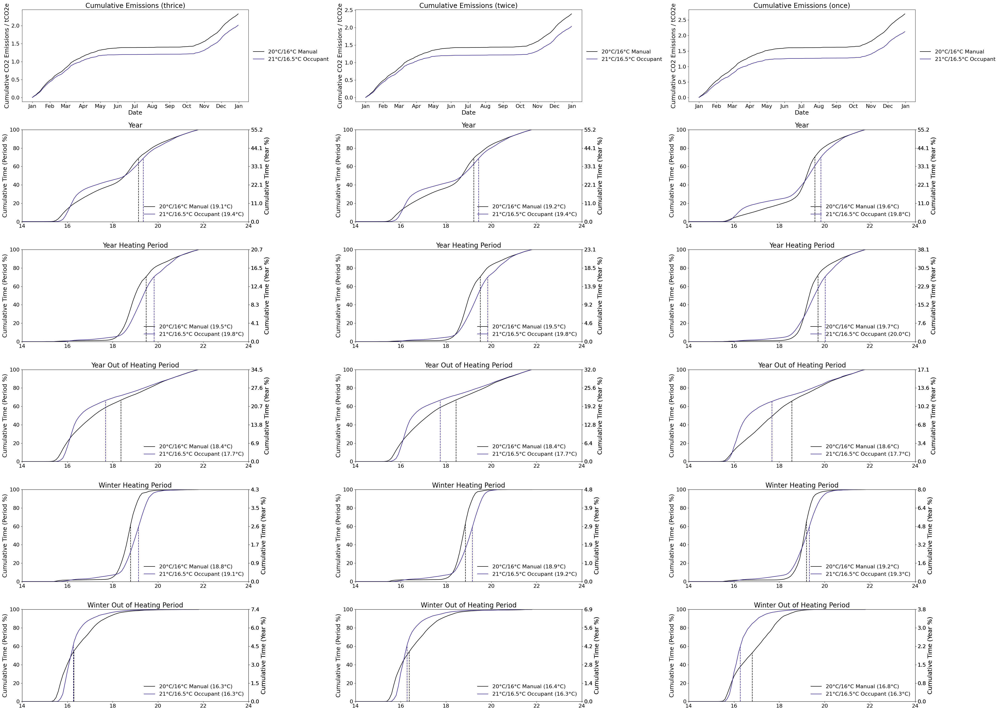

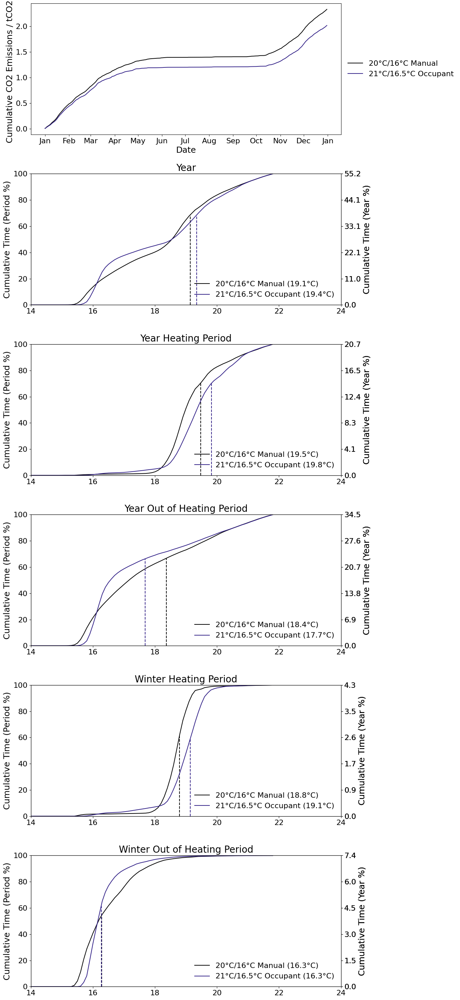

In [120]:
heating_patterns = ['thrice', 'twice', 'once']

for heating_pattern in heating_patterns[:1]:
    comparison_file_name = "zone9_21_16_5_monitor_condensed"

    manual_monitor_path = f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone0_monitor_condensed.csv"
    comparison_monitor_path = f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/{comparison_file_name}.csv"

    manual_monitor = pd.read_csv(manual_monitor_path,index_col=0)
    comparison_monitor = pd.read_csv(comparison_monitor_path,index_col=0)

    monitors_list, labels = segment_data(manual_monitor, comparison_monitor, heating_pattern)


    plot_cumulative_emissions_temperatures(manual_monitor, comparison_monitor, monitors_list, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names, labels)


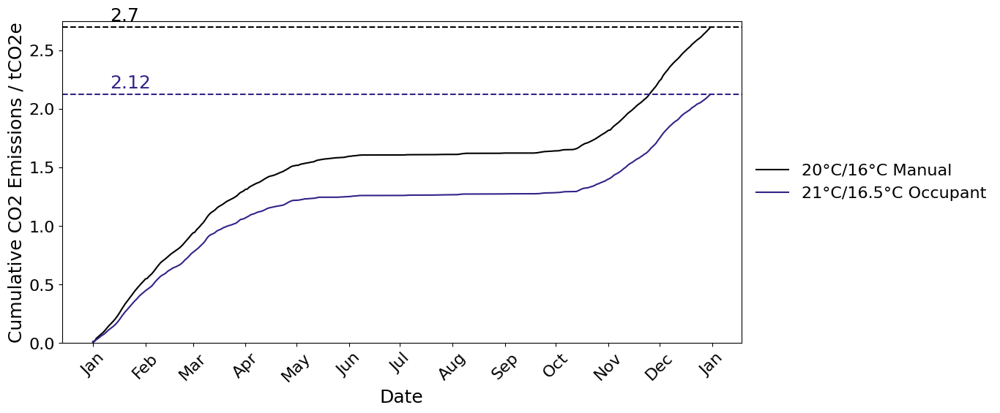

In [114]:
plot_cumulative_emissions(manual_monitor, comparison_monitor)

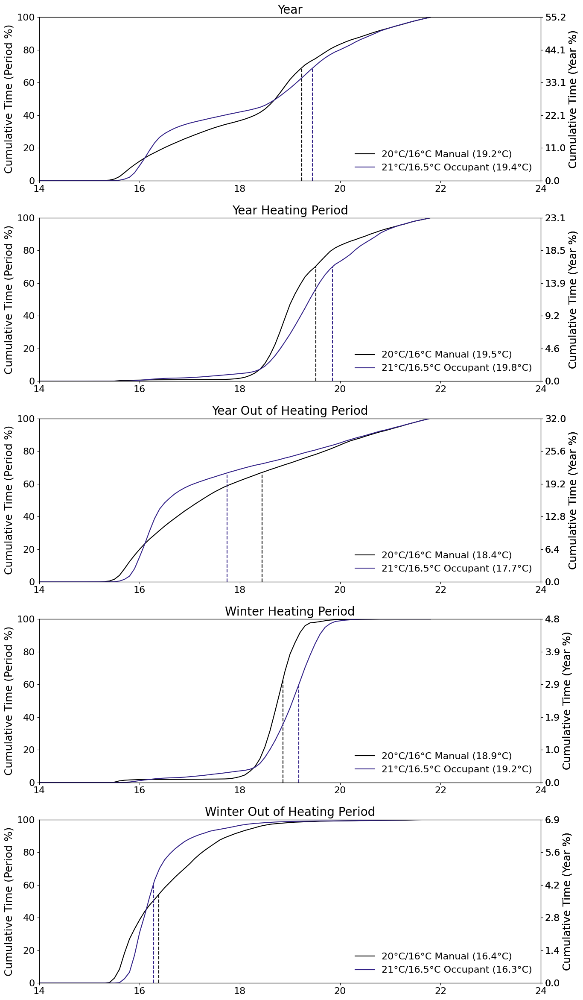

In [111]:
plot_multiple_rows(monitors_list, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names, labels)

In [23]:
zone0_20_16_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone0_monitor_condensed.csv",index_col=0)
zone9_20_16_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone9_20_16_monitor_condensed.csv",index_col=0)
zone9_21_15_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone9_21_15_monitor_condensed.csv",index_col=0)
zone9_20_5_16_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone9_20.5_16_monitor_condensed.csv",index_col=0)
zone9_21_16_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone9_21_16_monitor_condensed.csv",index_col=0)


In [26]:
zone0_20_16_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone0_monitor_condensed.csv",index_col=0)
zone9_20_16_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone9_20_16_5_monitor_condensed.csv",index_col=0)
zone9_21_15_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone9_20_5_16_5_monitor_condensed.csv",index_col=0)
zone9_20_5_16_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone9_21_16_5_monitor_condensed.csv",index_col=0)
zone9_21_16_monitor = pd.read_csv(f"/workspaces/CUBES/exp/jack/paper/thermostat_experiment/SI/winter_check/condensed_monitor_files/{heating_pattern}/zone9_21_16_monitor_condensed.csv",index_col=0)


In [7]:
rooms = {
    'Frontroom': ('Zone People Occupant Count(front_room)', 'Zone Operative Temperature(front_room)', 'Zone Air Temperature(front_room)'),
    'Backroom': ('Zone People Occupant Count(backroom)', 'Zone Operative Temperature(backroom)', 'Zone Air Temperature(backroom)'),
    'Kitchen': ('Zone People Occupant Count(kitchen)', 'Zone Operative Temperature(kitchen)', 'Zone Air Temperature(kitchen)'),
    'Hall (Downstairs)': ('Zone People Occupant Count(hall_downstairs)', 'Zone Operative Temperature(hall_downstairs)', 'Zone Air Temperature(hall_downstairs)'),
    'Bedroom 1': ('Zone People Occupant Count(bedroom_1)', 'Zone Operative Temperature(bedroom_1)', 'Zone Air Temperature(bedroom_1)'),
    'Bedroom 2': ('Zone People Occupant Count(bedroom_2)', 'Zone Operative Temperature(bedroom_2)', 'Zone Air Temperature(bedroom_2)'),
    'Bedroom 3': ('Zone People Occupant Count(bedroom_3)', 'Zone Operative Temperature(bedroom_3)', 'Zone Air Temperature(bedroom_3)'),
    'Bathroom': ('Zone People Occupant Count(bathroom)', 'Zone Operative Temperature(bathroom)', 'Zone Air Temperature(bathroom)'),
    'Hall (Upstairs)': ('Zone People Occupant Count(hall_upstairs)', 'Zone Operative Temperature(hall_upstairs)', 'Zone Air Temperature(hall_upstairs)')
}

In [ ]:
import pandas as pd

dfs = {
    'zone0_20_16_monitor': zone0_20_16_monitor,
    'zone9_20_monitor': zone9_20_16_monitor,
    'zone9_20_5_monitor': zone9_21_15_monitor,
    'zone9_21_monitor': zone9_20_5_16_monitor,
    'zone9_21_16_monitor': zone9_21_16_monitor
}

zone0_df = dfs.pop('zone0_20_16_monitor')  # Use this as the reference
zone0_df.index = pd.to_datetime(zone0_df.index)
zone0_df['hour'] = zone0_df.index.hour

room_level_diff = {}  # To store room-specific median differences
room_level_proportion = {}  # To store room-specific proportion colder

for name, df in dfs.items():
    df.index = pd.to_datetime(df.index)
    df['hour'] = df.index.hour
    median_diff_per_room = {}
    proportion_colder_per_room = {}

    for room, (occupant_col, operative_temp_col, _) in rooms.items():
        # Filter rows where occupants are present in both zone0 and the current dataset
        zone0_filtered = zone0_df[zone0_df[occupant_col] > 0]
        filtered_df = df[df[occupant_col] > 0]

        if not filtered_df.empty and not zone0_filtered.empty:
            # Merge both dataframes to align by time index
            merged_df = pd.merge(zone0_filtered[[operative_temp_col, 'hour', occupant_col]],
                                 filtered_df[[operative_temp_col, 'hour', occupant_col]],
                                 left_index=True, right_index=True,
                                 suffixes=('_zone0', f'_{name}'))

            if not merged_df.empty:
                # Adjust for the suffixed hour columns
                merged_df['hour'] = merged_df['hour_zone0']

                # Calculate the weighted median difference by the number of occupants
                merged_df['occupant_weight_zone0'] = merged_df[occupant_col + '_zone0']
                merged_df['occupant_weight_other'] = merged_df[occupant_col + f'_{name}']

                # Calculate weighted difference per hour using the occupant counts
                weighted_diff = (merged_df.groupby('hour')
                                 .apply(lambda x: (x[f'{operative_temp_col}_zone0'] * x['occupant_weight_zone0'] -
                                                   x[f'{operative_temp_col}_{name}'] * x['occupant_weight_other'])
                                         .sum() / (x['occupant_weight_zone0'] + x['occupant_weight_other']).sum()))
                median_diff_per_room[room] = weighted_diff

                # Calculate the proportion of hours where the other dataset is colder, weighted by occupants
                proportion_colder = (merged_df[f'{operative_temp_col}_{name}'] < merged_df[f'{operative_temp_col}_zone0']) * merged_df['occupant_weight_other']
                proportion_colder_per_room[room] = proportion_colder.groupby(merged_df['hour']).sum() / merged_df.groupby('hour')['occupant_weight_other'].sum()

    room_level_diff[name] = pd.DataFrame(median_diff_per_room)
    room_level_proportion[name] = pd.DataFrame(proportion_colder_per_room)

# Output the results
print("Room-level Weighted Median Difference Per Hour:")
for name, diff_df in room_level_diff.items():
    print(f"\n{name}:")
    print(diff_df)

print("\nRoom-level Weighted Proportion of Hours Colder:")
for name, prop_df in room_level_proportion.items():
    print(f"\n{name}:")
    print(prop_df)


In [29]:

dfs = {
    'zone0_20_16_monitor': zone0_20_16_monitor,
    'zone9_20_monitor': zone9_20_16_monitor,
    'zone9_20_5_monitor': zone9_21_15_monitor,
    'zone9_21_monitor': zone9_20_5_16_monitor,
    'zone9_21_16_monitor': zone9_21_16_monitor
}

zone0_df = dfs.pop('zone0_20_16_monitor')  # Use this as the reference
zone0_df.index = pd.to_datetime(zone0_df.index)
zone0_df['hour'] = zone0_df.index.hour

median_diff_per_hour = pd.DataFrame(index=range(24))  # To store the median difference per hour
proportion_colder_per_hour = pd.DataFrame(index=range(24))  # To store the proportion of hours colder

for name, df in dfs.items():
    df.index = pd.to_datetime(df.index)
    df['hour'] = df.index.hour
    median_diff = []
    proportion_colder = []

    for room, (occupant_col, operative_temp_col, _) in rooms.items():
        # Filter rows where occupants are present in both zone0 and the current dataset
        zone0_filtered = zone0_df[zone0_df[occupant_col] > 0]
        filtered_df = df[df[occupant_col] > 0]

        if not filtered_df.empty and not zone0_filtered.empty:
            # Merge both dataframes to align by time index
            merged_df = pd.merge(zone0_filtered[[operative_temp_col, 'hour']],
                                 filtered_df[[operative_temp_col, 'hour']],
                                 left_index=True, right_index=True,
                                 suffixes=('_zone0', f'_{name}'))

            if not merged_df.empty:
                # Adjust for the suffixed hour columns
                merged_df['hour'] = merged_df['hour_zone0']

                # Calculate the median difference per hour
                diff = merged_df.groupby('hour')[f'{operative_temp_col}_zone0'].median() - merged_df.groupby('hour')[f'{operative_temp_col}_{name}'].median()
                median_diff.append(diff)

                # Calculate the proportion of hours where the other dataset is colder
                colder = (merged_df[f'{operative_temp_col}_{name}'] < merged_df[f'{operative_temp_col}_zone0']).groupby(merged_df['hour']).mean()
                proportion_colder.append(colder)

    # Average the differences across all rooms
    if median_diff:
        median_diff_per_hour[name] = pd.concat(median_diff, axis=1).mean(axis=1)
    if proportion_colder:
        proportion_colder_per_hour[name] = pd.concat(proportion_colder, axis=1).mean(axis=1)



In [21]:


dfs = {
    'zone0_20_16_monitor': zone0_20_16_monitor,
    'zone9_20_monitor': zone9_20_16_monitor,
    'zone9_20_5_monitor': zone9_21_15_monitor,
    'zone9_21_monitor': zone9_20_5_16_monitor,
    'zone9_21_16_monitor': zone9_21_16_monitor
}

hourly_medians = {}

for name, df in dfs.items():
    df.index = pd.to_datetime(df.index)
    df['hour'] = df.index.hour
    room_medians = []

    for room, (occupant_col, operative_temp_col, _) in rooms.items():
        # Filter rows where occupants are present
        filtered_df = df[df[occupant_col] > 0]
        if not filtered_df.empty:
            # Calculate the median operative temperature per hour for this room
            room_medians.append(filtered_df.groupby('hour')[operative_temp_col].median())

    if room_medians:
        # Average the median temperatures across all rooms
        room_medians_df = pd.concat(room_medians, axis=1).mean(axis=1)
        hourly_medians[name] = room_medians_df

# Create a DataFrame with 24 hours as the index and the average operative temperatures for each dataset
median_df = pd.DataFrame(index=range(24))

for name, medians in hourly_medians.items():
    median_df[name] = medians



In [27]:
def filter_by_time_range(monitor_data, start_hour=None, end_hour=None):
    if start_hour is not None and end_hour is not None:
        return monitor_data[(monitor_data.index.hour >= start_hour) & (monitor_data.index.hour < end_hour)]
    else:
        return monitor_data  # Return all data if no time range is specified


room_areas = {'Frontroom': 14.04,
              'Kitchen': 11.34,
              'Backroom': 11.34,
              'Hall (Downstairs)': 7.02,
              'Bedroom 1': 11.51,
              'Bedroom 2': 12.39,
              'Bedroom 3': 6.86,
              'Bathroom': 7.105,
              'Hall (Upstairs)': 5.88}

total_floor_area = sum(room_areas.values())

rooms = {
    'Frontroom': ('Zone People Occupant Count(front_room)', 'Zone Operative Temperature(front_room)', 'Zone Air Temperature(front_room)'),
    'Backroom': ('Zone People Occupant Count(backroom)', 'Zone Operative Temperature(backroom)', 'Zone Air Temperature(backroom)'),
    'Kitchen': ('Zone People Occupant Count(kitchen)', 'Zone Operative Temperature(kitchen)', 'Zone Air Temperature(kitchen)'),
    'Hall (Downstairs)': ('Zone People Occupant Count(hall_downstairs)', 'Zone Operative Temperature(hall_downstairs)', 'Zone Air Temperature(hall_downstairs)'),
    'Bedroom 1': ('Zone People Occupant Count(bedroom_1)', 'Zone Operative Temperature(bedroom_1)', 'Zone Air Temperature(bedroom_1)'),
    'Bedroom 2': ('Zone People Occupant Count(bedroom_2)', 'Zone Operative Temperature(bedroom_2)', 'Zone Air Temperature(bedroom_2)'),
    'Bedroom 3': ('Zone People Occupant Count(bedroom_3)', 'Zone Operative Temperature(bedroom_3)', 'Zone Air Temperature(bedroom_3)'),
    'Bathroom': ('Zone People Occupant Count(bathroom)', 'Zone Operative Temperature(bathroom)', 'Zone Air Temperature(bathroom)'),
    'Hall (Upstairs)': ('Zone People Occupant Count(hall_upstairs)', 'Zone Operative Temperature(hall_upstairs)', 'Zone Air Temperature(hall_upstairs)')
}

#run_names = {0: "20°C/16°C Manual", 1: "20°C/16°C Occupant", 2: "21°C/15°C Occupant", 3: "20.5°C/16°C Occupant",  4: "21°C/16°C Occupant"}
run_names = {0: "20°C/16°C Manual", 1: "20°C/16.5°C Occupant", 2: "20.5°C/16.5°C Occupant", 3: "21°C/16.5°C Occupant",  4: "21°C/16°C Occupant"}
run_colours = {0: "black", 1: "#332288", 2: "#0077BB", 3: "#33BBEE", 4:"#EE3377"}

bin_edges = np.arange(14, 22.0, 0.25)

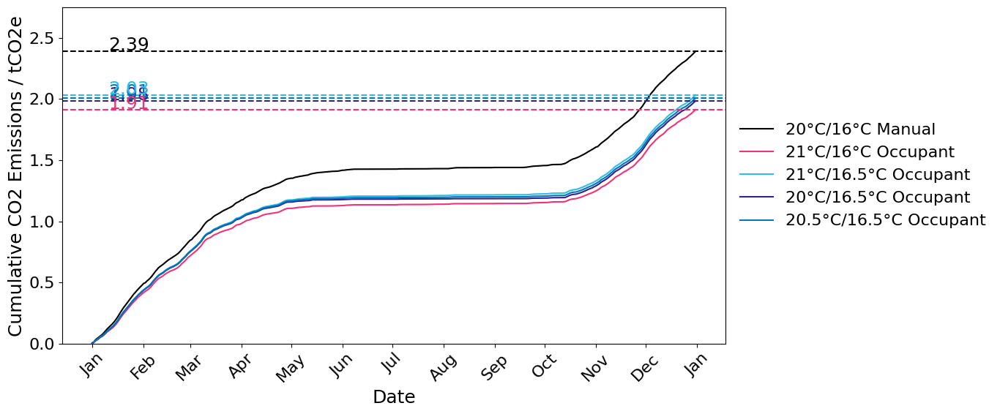

In [28]:
# Extract the CO2 emissions columns from each dataset and create copies for modification
co2_emissions_zone0 = zone0_20_16_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()
co2_emissions_zone9 = zone9_20_16_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()
co2_emissions_setback = zone9_21_15_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()
co2_emissions_comfort = zone9_20_5_16_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()
co2_emissions_setback_comfort = zone9_21_16_monitor["Environmental Impact Total CO2 Emissions Carbon Equivalent Mass(Site)"].copy()

# Ensure the index is in datetime format for each CO2 emissions dataset
co2_emissions_zone0.index = pd.to_datetime(co2_emissions_zone0.index)
co2_emissions_zone9.index = pd.to_datetime(co2_emissions_zone9.index)
co2_emissions_setback.index = pd.to_datetime(co2_emissions_setback.index)
co2_emissions_comfort.index = pd.to_datetime(co2_emissions_comfort.index)
co2_emissions_setback_comfort.index = pd.to_datetime(co2_emissions_setback_comfort.index)

# Convert all CO2 emissions to tonnes by dividing by 1000 (modifying copies, not the original data)
co2_emissions_zone0 /= 1000
co2_emissions_zone9 /= 1000
co2_emissions_setback /= 1000
co2_emissions_comfort /= 1000
co2_emissions_setback_comfort /= 1000

# Resample the datasets to daily frequency and compute cumulative sums
cumulative_co2_setback = co2_emissions_setback.resample('D').sum().cumsum()
cumulative_co2_comfort = co2_emissions_comfort.resample('D').sum().cumsum()
cumulative_co2_zone0 = co2_emissions_zone0.resample('D').sum().cumsum()
cumulative_co2_zone9 = co2_emissions_zone9.resample('D').sum().cumsum()
cumulative_co2_setback_comfort = co2_emissions_setback_comfort.resample('D').sum().cumsum()

# Calculate total sums for each dataset (in tonnes)
total_co2_setback = co2_emissions_setback.sum()
total_co2_comfort = co2_emissions_comfort.sum()
total_co2_zone0 = co2_emissions_zone0.sum()
total_co2_zone9 = co2_emissions_zone9.sum()
total_co2_setback_comfort = co2_emissions_setback_comfort.sum()

# Create the cumulative plot
plt.figure(figsize=(14, 6))

# Plot cumulative CO2 emissions for each dataset using seaborn
sns.lineplot(x=cumulative_co2_zone0.index, y=cumulative_co2_zone0, label=f'{run_names.get(0)}', color=run_colours.get(0))
sns.lineplot(x=cumulative_co2_setback_comfort.index, y=cumulative_co2_setback_comfort, label=f'{run_names.get(4)}', color=run_colours.get(4))
sns.lineplot(x=cumulative_co2_comfort.index, y=cumulative_co2_comfort, label=f'{run_names.get(3)}', color=run_colours.get(3))
sns.lineplot(x=cumulative_co2_zone9.index, y=cumulative_co2_zone9, label=f'{run_names.get(1)}', color=run_colours.get(1))
sns.lineplot(x=cumulative_co2_setback.index, y=cumulative_co2_setback, label=f'{run_names.get(2)}', color=run_colours.get(2))

# Add horizontal lines for total CO2 emissions
plt.axhline(y=total_co2_zone0, color=run_colours.get(0), linestyle='--')
plt.axhline(y=total_co2_zone9, color=run_colours.get(1), linestyle='--')
plt.axhline(y=total_co2_setback, color=run_colours.get(2), linestyle='--')
plt.axhline(y=total_co2_comfort, color=run_colours.get(3), linestyle='--')
plt.axhline(y=total_co2_setback_comfort, color=run_colours.get(4), linestyle='--')

# Define the initial positions for the annotations (in tonnes)
x_vals = [cumulative_co2_zone0.index[10]] * 5  # Use the last available date for annotation
y_vals = [total_co2_zone0, total_co2_zone9, total_co2_setback, total_co2_comfort, total_co2_setback_comfort]
texts = [f"{total_co2_zone0:.3g}", f"{total_co2_zone9:.3g}", f"{total_co2_setback:.3g}", f"{total_co2_comfort:.3g}", f"{total_co2_setback_comfort:.3g}"]

# Create text objects for each annotation
for i in range(len(x_vals)):
    plt.text(x_vals[i], y_vals[i] + 0.05, texts[i], color=run_colours.get(i), va='center')

# Set the x-axis major ticks to the first day of each month
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(bymonthday=1))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b'))  # Format as 'Jan'

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Cumulative CO2 Emissions / tCO2e")  # Change kgCO2e to tCO2e

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)
plt.ylim([0, 2.75])  # Adjusted for tonnes scale

# Position the legend outside the plot at the centre-right
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

# Show the plot
plt.tight_layout()  # Automatically adjust layout to prevent label overlap
plt.show()


In [10]:
total_co2_zone0





2.6951686356630717

In [11]:
total_co2_zone9

2.0477932440102853

In [12]:
total_co2_setback

2.083276911401827

In [13]:
total_co2_comfort

2.1221429345487923

In [14]:
total_co2_setback_comfort

2.013056059928046

In [29]:


# Define your heating patterns
heating_patterns = {
    'once': [(6, 23)],  # Heating once from 06:00 to 23:00
    'twice': [(6, 9), (16, 23)],  # Heating twice: 06:00-09:00, 16:00-23:00
    'thrice': [(6, 8), (12, 14), (18, 23)]  # Heating thrice: 06:00-08:00, 12:00-14:00, 18:00-23:00
}

# Get the time ranges for the selected heating pattern
heating_pattern = 'twice'  # For example, you can choose 'once', 'twice', 'thrice'
time_ranges = heating_patterns[heating_pattern]

# List of monitors (winter and year)
monitors_year = [zone0_20_16_monitor,
                 zone9_20_16_monitor,
                 zone9_21_15_monitor,
                 zone9_20_5_16_monitor,
                 zone9_21_16_monitor]

monitors_winter = [zone0_20_16_monitor,
                   zone9_20_16_monitor,
                   zone9_21_15_monitor,
                   zone9_20_5_16_monitor,
                   zone9_21_16_monitor]

# Ensure the index is in datetime format for each monitor (both winter and year)
for i in range(len(monitors_winter)):
    monitors_winter[i].index = pd.to_datetime(monitors_winter[i].index)
    monitors_winter[i] = monitors_winter[i].loc[:'2013-03-31 23:59:59']  # Apply date range filter

for i in range(len(monitors_year)):
    monitors_year[i].index = pd.to_datetime(monitors_year[i].index)

# Function to filter by dynamic time ranges (for heating periods)
def filter_by_time_ranges(monitor, time_ranges):
    time_slices = [filter_by_time_range(monitor, start, end) for start, end in time_ranges]
    return pd.concat(time_slices).sort_index()

# Apply dynamic time slicing for heating period
monitors_winter_heating_period = [filter_by_time_ranges(monitor, time_ranges) for monitor in monitors_winter]
monitors_year_heating_period = [filter_by_time_ranges(monitor, time_ranges) for monitor in monitors_year]

# Slicing time **out of heating period** (excluding heating hours and sleep hours)
def filter_out_of_heating_period_and_sleep(monitor, time_ranges):
    # Condition to filter out heating hours
    condition = pd.Series([True] * len(monitor), index=monitor.index)
    for start, end in time_ranges:
        condition &= ~((monitor.index.hour >= start) & (monitor.index.hour < end))

    # Exclude sleep hours (23:00 - 06:00)
    condition &= ~((monitor.index.hour >= 23) | (monitor.index.hour < 6))

    return monitor.loc[condition]

# Apply dynamic time slicing for out-of-heating period, also excluding sleep hours
monitors_winter_out_of_heating_period = [
    filter_out_of_heating_period_and_sleep(monitor, time_ranges) for monitor in monitors_winter
]
monitors_year_out_of_heating_period = [
    filter_out_of_heating_period_and_sleep(monitor, time_ranges) for monitor in monitors_year
]


In [66]:

def plot_temperature_comparison(monitors_condensed, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names):
    fig, axes = plt.subplots(len(rooms) + 1, 4, figsize=(22, (len(rooms) + 1) * 4), sharey=True)

    def plot_room_comparisons(room, idx, occupant_count_col, op_temp_col):
        room_area_weight = room_areas[room] / total_floor_area
        first_run_op_temps = monitors_condensed[0][monitors_condensed[0][occupant_count_col] > 0][op_temp_col]

        for i, monitor in enumerate(monitors_condensed[1:], start=1):  # Start from 1 to skip first run
            ax = axes[idx, i-1]
            current_run_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]

            counts_first, bins = np.histogram(first_run_op_temps, bins=bin_edges)
            counts_current, _ = np.histogram(current_run_op_temps, bins=bin_edges)

            counts_percentage_first = (counts_first / counts_first.sum()) * 100
            counts_percentage_current = (counts_current / counts_current.sum()) * 100

            print(counts_percentage_first)
            print(counts_percentage_current)



            ax.plot(bins[:-1], counts_percentage_first, marker='none', linestyle='-', color=run_colours[0], label=f'{first_run_op_temps.median():.1f}°C')
            ax.plot(bins[:-1], counts_percentage_current, marker='none', linestyle='--', color=run_colours[i], label=f'{current_run_op_temps.median():.1f}°C')

            median_first = first_run_op_temps.median()
            y_median_first = np.interp(median_first, bins[:-1], counts_percentage_first)
            ax.plot([median_first, median_first], [0, y_median_first], color=run_colours[0], linestyle='--')

            median_current = current_run_op_temps.median()
            y_median_current = np.interp(median_current, bins[:-1], counts_percentage_current)
            ax.plot([median_current, median_current], [0, y_median_current], color=run_colours[i], linestyle='--')

            if idx == 0:
                ax.set_title(f'{run_names.get(i)}')

            ax.set_ylim(0, 50)
            ax.set_xlim(14, 22)
            ax.legend(loc='upper left', frameon=False)

        axes[idx, 0].set_ylabel(f'$\mathbf{{{room}}}$\nTime at Temperature (%)')

    def calculate_weighted_totals():
        weighted_counts_op = [np.zeros(len(bin_edges) - 1) for _ in range(5)]
        combined_op_monitor = [[] for _ in range(5)]

        for room, (occupant_count_col, op_temp_col, air_temp_col) in rooms.items():
            room_area_weight = room_areas[room] / total_floor_area

            for i, monitor in enumerate(monitors_condensed):
                filtered_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]
                counts_op, bins = np.histogram(filtered_op_temps, bins=bin_edges)
                counts_percentage_op = (counts_op / counts_op.sum()) * 100
                weighted_counts_op[i] += counts_percentage_op * room_area_weight
                combined_op_monitor[i].extend(filtered_op_temps)

        return weighted_counts_op, combined_op_monitor

    def plot_combined_room(axes, weighted_counts_op, combined_op_monitor):
        medians_op_monitor = [np.median(combined_op) for combined_op in combined_op_monitor]

        for i in range(4):
            final_op_ax = axes[-1, i]
            final_op_ax.set_ylim(0, 50)
            final_op_ax.set_xlim(14, 22)
            final_op_ax.plot(bin_edges[:-1], weighted_counts_op[0], linestyle='-', color=run_colours[0], label=f'{medians_op_monitor[0]:.1f}°C')
            final_op_ax.set_xlabel('Temperature (°C)')
            y_median_0 = np.interp(medians_op_monitor[0], bin_edges[:-1], weighted_counts_op[0])
            final_op_ax.plot([medians_op_monitor[0], medians_op_monitor[0]], [0, y_median_0], color=run_colours[0], linestyle='--')

            if i == 0:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[1], linestyle='-', color=run_colours[1], label=f'{medians_op_monitor[1]:.1f}°C')
                y_median_1 = np.interp(medians_op_monitor[1], bin_edges[:-1], weighted_counts_op[1])
                final_op_ax.plot([medians_op_monitor[1], medians_op_monitor[1]], [0, y_median_1], color=run_colours[1], linestyle='--')
            elif i == 1:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[2], linestyle='-', color=run_colours[2], label=f'{medians_op_monitor[2]:.1f}°C')
                y_median_2 = np.interp(medians_op_monitor[2], bin_edges[:-1], weighted_counts_op[2])
                final_op_ax.plot([medians_op_monitor[2], medians_op_monitor[2]], [0, y_median_2], color=run_colours[2], linestyle='--')
            elif i == 2:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[3], linestyle='-', color=run_colours[3], label=f'{medians_op_monitor[3]:.1f}°C')
                y_median_3 = np.interp(medians_op_monitor[3], bin_edges[:-1], weighted_counts_op[3])
                final_op_ax.plot([medians_op_monitor[3], medians_op_monitor[3]], [0, y_median_3], color=run_colours[3], linestyle='--')
            elif i == 3:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[4], linestyle='-', color=run_colours[4], label=f'{medians_op_monitor[4]:.1f}°C')
                y_median_4 = np.interp(medians_op_monitor[4], bin_edges[:-1], weighted_counts_op[4])
                final_op_ax.plot([medians_op_monitor[4], medians_op_monitor[4]], [0, y_median_4], color=run_colours[4], linestyle='--')

            if i == 0:
                final_op_ax.set_ylabel(f'$\mathbf{{Room Weighted}}$\nTime at Temperature (%)')

            final_op_ax.legend(loc='upper left', frameon=False)

    # Plot the room comparisons
    for idx, (room, (occupant_count_col, op_temp_col, air_temp_col)) in enumerate(rooms.items()):
        plot_room_comparisons(room, idx, occupant_count_col, op_temp_col)

    # Calculate weighted totals
    weighted_counts_op, combined_op_monitor = calculate_weighted_totals()

    # Plot the combined room data
    plot_combined_room(axes, weighted_counts_op, combined_op_monitor)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [44]:
def plot_temperature_comparison(monitors_condensed, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names):
    total_minutes_in_year = 525600  # Total minutes in a year

    fig, axes = plt.subplots(len(rooms) + 1, 4, figsize=(22, (len(rooms) + 1) * 4), sharey=True)

    def plot_room_comparisons(room, idx, occupant_count_col, op_temp_col):
        room_area_weight = room_areas[room] / total_floor_area
        first_run_op_temps = monitors_condensed[0][monitors_condensed[0][occupant_count_col] > 0][op_temp_col]

        for i, monitor in enumerate(monitors_condensed[1:], start=1):
            ax = axes[idx, i-1]
            current_run_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]

            normalisation = len(current_run_op_temps) / total_minutes_in_year

            counts_first, bins = np.histogram(first_run_op_temps, bins=bin_edges)
            counts_current, _ = np.histogram(current_run_op_temps, bins=bin_edges)

            counts_percentage_first = (counts_first / counts_first.sum()) * 100
            counts_percentage_current = (counts_current / counts_current.sum()) * 100

            ax.plot(bins[:-1], counts_percentage_first, marker='none', linestyle='-', color=run_colours[0], label=f'{first_run_op_temps.median():.1f}°C')
            ax.plot(bins[:-1], counts_percentage_current, marker='none', linestyle='--', color=run_colours[i], label=f'{current_run_op_temps.median():.1f}°C')

            median_first = first_run_op_temps.median()
            y_median_first = np.interp(median_first, bins[:-1], counts_percentage_first)
            ax.plot([median_first, median_first], [0, y_median_first], color=run_colours[0], linestyle='--')

            median_current = current_run_op_temps.median()
            y_median_current = np.interp(median_current, bins[:-1], counts_percentage_current)
            ax.plot([median_current, median_current], [0, y_median_current], color=run_colours[i], linestyle='--')

            if idx == 0:
                ax.set_title(f'{run_names.get(i)}')

            ax.set_ylim(0, 50)
            ax.set_xlim(14, 22)
            ax.legend(loc='upper left', frameon=False)

            # Secondary Y-axis
            ax2 = ax.twinx()

            # Adjust the secondary axis ticks based on the normalisation value (total minutes in a year)
            ax2.set_ylim(0, 50)
            secax_ticks = ax.get_yticks()
            ax2_ticks = secax_ticks * normalisation
            ax2.set_yticks(secax_ticks)
            ax2.set_yticklabels([f'{float(tick):.1f}' for tick in ax2_ticks])
            ax2.set_ylabel('Percentage of Year')

        axes[idx, 0].set_ylabel(f'$\mathbf{{{room}}}$\nTime at Temperature (%)')

    def calculate_weighted_totals():
        weighted_counts_op = [np.zeros(len(bin_edges) - 1) for _ in range(5)]
        combined_op_monitor = [[] for _ in range(5)]

        for room, (occupant_count_col, op_temp_col, air_temp_col) in rooms.items():
            room_area_weight = room_areas[room] / total_floor_area

            for i, monitor in enumerate(monitors_condensed):
                filtered_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]
                counts_op, bins = np.histogram(filtered_op_temps, bins=bin_edges)
                counts_percentage_op = (counts_op / counts_op.sum()) * 100
                weighted_counts_op[i] += counts_percentage_op * room_area_weight
                combined_op_monitor[i].extend(filtered_op_temps)

        return weighted_counts_op, combined_op_monitor

    def plot_combined_room(axes, weighted_counts_op, combined_op_monitor):
        medians_op_monitor = [np.median(combined_op) for combined_op in combined_op_monitor]

        for i in range(4):
            final_op_ax = axes[-1, i]
            final_op_ax.set_ylim(0, 50)
            final_op_ax.set_xlim(14, 22)
            final_op_ax.plot(bin_edges[:-1], weighted_counts_op[0], linestyle='-', color=run_colours[0], label=f'{medians_op_monitor[0]:.1f}°C')
            final_op_ax.set_xlabel('Temperature (°C)')
            y_median_0 = np.interp(medians_op_monitor[0], bin_edges[:-1], weighted_counts_op[0])
            final_op_ax.plot([medians_op_monitor[0], medians_op_monitor[0]], [0, y_median_0], color=run_colours[0], linestyle='--')

            if i == 0:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[1], linestyle='-', color=run_colours[1], label=f'{medians_op_monitor[1]:.1f}°C')
                y_median_1 = np.interp(medians_op_monitor[1], bin_edges[:-1], weighted_counts_op[1])
                final_op_ax.plot([medians_op_monitor[1], medians_op_monitor[1]], [0, y_median_1], color=run_colours[1], linestyle='--')
            elif i == 1:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[2], linestyle='-', color=run_colours[2], label=f'{medians_op_monitor[2]:.1f}°C')
                y_median_2 = np.interp(medians_op_monitor[2], bin_edges[:-1], weighted_counts_op[2])
                final_op_ax.plot([medians_op_monitor[2], medians_op_monitor[2]], [0, y_median_2], color=run_colours[2], linestyle='--')
            elif i == 2:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[3], linestyle='-', color=run_colours[3], label=f'{medians_op_monitor[3]:.1f}°C')
                y_median_3 = np.interp(medians_op_monitor[3], bin_edges[:-1], weighted_counts_op[3])
                final_op_ax.plot([medians_op_monitor[3], medians_op_monitor[3]], [0, y_median_3], color=run_colours[3], linestyle='--')
            elif i == 3:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[4], linestyle='-', color=run_colours[4], label=f'{medians_op_monitor[4]:.1f}°C')
                y_median_4 = np.interp(medians_op_monitor[4], bin_edges[:-1], weighted_counts_op[4])
                final_op_ax.plot([medians_op_monitor[4], medians_op_monitor[4]], [0, y_median_4], color=run_colours[4], linestyle='--')

            # Secondary Y-axis
            ax2 = final_op_ax.twinx()

            ax2.set_ylim(0, 50)
            secax_ticks = final_op_ax.get_yticks()
            ax2_ticks = secax_ticks * normalisation
            ax2.set_yticks(secax_ticks)
            ax2.set_yticklabels([f'{float(tick):.1f}' for tick in ax2_ticks])
            ax2.set_ylabel('Percentage of Year')

            if i == 0:
                final_op_ax.set_ylabel(f'$\mathbf{{Room Weighted}}$\nTime at Temperature (%)')

            final_op_ax.legend(loc='upper left', frameon=False)

    for idx, (room, (occupant_count_col, op_temp_col, air_temp_col)) in enumerate(rooms.items()):
        plot_room_comparisons(room, idx, occupant_count_col, op_temp_col)

    weighted_counts_op, combined_op_monitor = calculate_weighted_totals()

    plot_combined_room(axes, weighted_counts_op, combined_op_monitor)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [47]:
import numpy as np
import matplotlib.pyplot as plt

def plot_temperature_comparison_with_cumulative(monitors_condensed, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names):
    total_minutes_in_year = 525600  # Total minutes in a year

    fig, axes = plt.subplots(len(rooms) + 1, 4, figsize=(22, (len(rooms) + 1) * 4), sharey=True)

    # Function to plot the cumulative sum for each room
    def plot_room_comparisons(room, idx, occupant_count_col, op_temp_col):
        room_area_weight = room_areas[room] / total_floor_area
        first_run_op_temps = monitors_condensed[0][monitors_condensed[0][occupant_count_col] > 0][op_temp_col]

        for i, monitor in enumerate(monitors_condensed[1:], start=1):
            ax = axes[idx, i-1]
            current_run_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]

            # Calculate normalisation based on total valid minutes with occupancy
            normalisation = len(current_run_op_temps) / total_minutes_in_year

            counts_first, bins = np.histogram(first_run_op_temps, bins=bin_edges)
            counts_current, _ = np.histogram(current_run_op_temps, bins=bin_edges)

            # Calculate cumulative percentage
            counts_percentage_first = np.cumsum((counts_first / counts_first.sum()) * 100)
            counts_percentage_current = np.cumsum((counts_current / counts_current.sum()) * 100)

            # Plot cumulative percentage
            ax.plot(bins[:-1], counts_percentage_first, marker='none', linestyle='-', color=run_colours[0], label=f'{first_run_op_temps.median():.1f}°C')
            ax.plot(bins[:-1], counts_percentage_current, marker='none', linestyle='--', color=run_colours[i], label=f'{current_run_op_temps.median():.1f}°C')

            median_first = first_run_op_temps.median()
            y_median_first = np.interp(median_first, bins[:-1], counts_percentage_first)
            ax.plot([median_first, median_first], [0, y_median_first], color=run_colours[0], linestyle='--')

            median_current = current_run_op_temps.median()
            y_median_current = np.interp(median_current, bins[:-1], counts_percentage_current)
            ax.plot([median_current, median_current], [0, y_median_current], color=run_colours[i], linestyle='--')

            if idx == 0:
                ax.set_title(f'{run_names.get(i)}')

            ax.set_ylim(0, 100)
            ax.set_xlim(14, 22)
            ax.legend(loc='upper left', frameon=False)

            # Secondary Y-axis
            ax2 = ax.twinx()

            # Adjust the secondary axis ticks based on the normalisation value (cumulative time in year)
            ax2.set_ylim(0, 100)
            secax_ticks = ax.get_yticks()
            ax2_ticks = secax_ticks * normalisation
            ax2.set_yticks(secax_ticks)
            ax2.set_yticklabels([f'{tick * normalisation:.1f}' for tick in secax_ticks])  # Corrected normalisation for ticks
            ax2.set_ylabel('Cumulative Time (Fraction of Year)')

        axes[idx, 0].set_ylabel(f'$\mathbf{{{room}}}$\nCumulative Time at Temperature (%)')

    # Calculate weighted totals for the cumulative plot
    def calculate_weighted_totals():
        weighted_counts_op = [np.zeros(len(bin_edges) - 1) for _ in range(len(monitors_condensed))]
        combined_op_monitor = [[] for _ in range(len(monitors_condensed))]

        for room, (occupant_count_col, op_temp_col, air_temp_col) in rooms.items():
            room_area_weight = room_areas[room] / total_floor_area

            for i, monitor in enumerate(monitors_condensed):
                filtered_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]
                counts_op, bins = np.histogram(filtered_op_temps, bins=bin_edges)
                counts_percentage_op = np.cumsum((counts_op / counts_op.sum()) * 100)
                weighted_counts_op[i] += counts_percentage_op * room_area_weight
                combined_op_monitor[i].extend(filtered_op_temps)

        return weighted_counts_op, combined_op_monitor

    # Plot the cumulative totals for all rooms
    def plot_combined_room(axes, weighted_counts_op, combined_op_monitor):
        medians_op_monitor = [np.median(combined_op) for combined_op in combined_op_monitor]

        for i in range(4):
            final_op_ax = axes[-1, i]

            # Get the normalisation for this monitor
            current_run_op_temps = combined_op_monitor[i]
            normalisation = len(current_run_op_temps) / total_minutes_in_year

            final_op_ax.set_ylim(0, 100)
            final_op_ax.set_xlim(14, 22)
            final_op_ax.plot(bin_edges[:-1], weighted_counts_op[0], linestyle='-', color=run_colours[0], label=f'{medians_op_monitor[0]:.1f}°C')
            final_op_ax.set_xlabel('Temperature (°C)')
            y_median_0 = np.interp(medians_op_monitor[0], bin_edges[:-1], weighted_counts_op[0])
            final_op_ax.plot([medians_op_monitor[0], medians_op_monitor[0]], [0, y_median_0], color=run_colours[0], linestyle='--')

            if i == 0:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[1], linestyle='-', color=run_colours[1], label=f'{medians_op_monitor[1]:.1f}°C')
                y_median_1 = np.interp(medians_op_monitor[1], bin_edges[:-1], weighted_counts_op[1])
                final_op_ax.plot([medians_op_monitor[1], medians_op_monitor[1]], [0, y_median_1], color=run_colours[1], linestyle='--')
            elif i == 1:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[2], linestyle='-', color=run_colours[2], label=f'{medians_op_monitor[2]:.1f}°C')
                y_median_2 = np.interp(medians_op_monitor[2], bin_edges[:-1], weighted_counts_op[2])
                final_op_ax.plot([medians_op_monitor[2], medians_op_monitor[2]], [0, y_median_2], color=run_colours[2], linestyle='--')
            elif i == 2:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[3], linestyle='-', color=run_colours[3], label=f'{medians_op_monitor[3]:.1f}°C')
                y_median_3 = np.interp(medians_op_monitor[3], bin_edges[:-1], weighted_counts_op[3])
                final_op_ax.plot([medians_op_monitor[3], medians_op_monitor[3]], [0, y_median_3], color=run_colours[3], linestyle='--')
            elif i == 3:
                final_op_ax.plot(bin_edges[:-1], weighted_counts_op[4], linestyle='-', color=run_colours[4], label=f'{medians_op_monitor[4]:.1f}°C')
                y_median_4 = np.interp(medians_op_monitor[4], bin_edges[:-1], weighted_counts_op[4])
                final_op_ax.plot([medians_op_monitor[4], medians_op_monitor[4]], [0, y_median_4], color=run_colours[4], linestyle='--')

            # Secondary Y-axis
            ax2 = final_op_ax.twinx()

            ax2.set_ylim(0, 100)
            secax_ticks = final_op_ax.get_yticks()
            ax2_ticks = secax_ticks * normalisation
            ax2.set_yticks(secax_ticks)
            ax2.set_yticklabels([f'{tick * normalisation:.1f}' for tick in secax_ticks])
            ax2.set_ylabel('Cumulative Percentage of Year')

            if i == 0:
                final_op_ax.set_ylabel(f'$\mathbf{{Room Weighted}}$\nCumulative Time at Temperature (%)')

            final_op_ax.legend(loc='upper left', frameon=False)

    # Plot individual room comparisons (now cumulative)
    for idx, (room, (occupant_count_col, op_temp_col, air_temp_col)) in enumerate(rooms.items()):
        plot_room_comparisons(room, idx, occupant_count_col, op_temp_col)

    # Calculate the cumulative weighted totals for the last row
    weighted_counts_op, combined_op_monitor = calculate_weighted_totals()

    # Plot the final cumulative row at the bottom
    plot_combined_room(axes, weighted_counts_op, combined_op_monitor)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [17]:


def plot_combined_room_only(monitors_condensed, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names):
    total_minutes_in_year = 525600  # Total minutes in a year

    fig, ax = plt.subplots(1, 4, figsize=(22, 5), sharey=True)

    # Calculate total occupied minutes for each monitor
    def calculate_total_occupied_minutes(monitors_condensed, rooms):
        total_occupied_minutes_per_monitor = []
        for monitor in monitors_condensed:
            total_occupied = 0
            for room, (occupant_count_col, _, _) in rooms.items():
                # Sum total minutes where occupancy is greater than zero for this room and monitor
                total_occupied += (monitor[occupant_count_col] > 0).sum()
            total_occupied_minutes_per_monitor.append(total_occupied)
        return total_occupied_minutes_per_monitor

    # Calculate weighted totals for the cumulative plot
    def calculate_weighted_totals(total_occupied_minutes):
        weighted_counts_op = [np.zeros(len(bin_edges) - 1) for _ in range(len(monitors_condensed))]
        combined_op_monitor = [[] for _ in range(len(monitors_condensed))]

        for room, (occupant_count_col, op_temp_col, air_temp_col) in rooms.items():
            room_area_weight = room_areas[room] / total_floor_area

            for i, monitor in enumerate(monitors_condensed):
                filtered_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]
                counts_op, bins = np.histogram(filtered_op_temps, bins=bin_edges)
                counts_percentage_op = np.cumsum((counts_op / counts_op.sum()) * 100)

                # Weight counts by room area and add to cumulative total
                weighted_counts_op[i] += counts_percentage_op * room_area_weight
                combined_op_monitor[i].extend(filtered_op_temps)

        return weighted_counts_op, combined_op_monitor

    # Plot the cumulative totals for all rooms
    def plot_combined_room(ax, weighted_counts_op, combined_op_monitor, total_occupied_minutes_per_monitor):
        medians_op_monitor = [np.median(combined_op) for combined_op in combined_op_monitor]

        for i in range(4):
            current_ax = ax[i]

            # Normalisation is now based on total occupied minutes for the monitor compared to the total minutes in a year
            normalisation = total_occupied_minutes_per_monitor[i] / total_minutes_in_year  # Normalisation per dataset

            current_ax.set_ylim(0, 100)
            current_ax.set_xlim(14, 24)

            # Plot the weighted cumulative distributions
            current_ax.plot(bin_edges[:-1], weighted_counts_op[0], linestyle='-', color=run_colours[0], label=f'{medians_op_monitor[0]:.1f}°C')
            y_median_0 = np.interp(medians_op_monitor[0], bin_edges[:-1], weighted_counts_op[0])
            current_ax.plot([medians_op_monitor[0], medians_op_monitor[0]], [0, y_median_0], color=run_colours[0], linestyle='--')

            if i == 0:
                current_ax.plot(bin_edges[:-1], weighted_counts_op[1], linestyle='-', color=run_colours[1], label=f'{medians_op_monitor[1]:.1f}°C')
                y_median_1 = np.interp(medians_op_monitor[1], bin_edges[:-1], weighted_counts_op[1])
                current_ax.plot([medians_op_monitor[1], medians_op_monitor[1]], [0, y_median_1], color=run_colours[1], linestyle='--')
            elif i == 1:
                current_ax.plot(bin_edges[:-1], weighted_counts_op[2], linestyle='-', color=run_colours[2], label=f'{medians_op_monitor[2]:.1f}°C')
                y_median_2 = np.interp(medians_op_monitor[2], bin_edges[:-1], weighted_counts_op[2])
                current_ax.plot([medians_op_monitor[2], medians_op_monitor[2]], [0, y_median_2], color=run_colours[2], linestyle='--')
            elif i == 2:
                current_ax.plot(bin_edges[:-1], weighted_counts_op[3], linestyle='-', color=run_colours[3], label=f'{medians_op_monitor[3]:.1f}°C')
                y_median_3 = np.interp(medians_op_monitor[3], bin_edges[:-1], weighted_counts_op[3])
                current_ax.plot([medians_op_monitor[3], medians_op_monitor[3]], [0, y_median_3], color=run_colours[3], linestyle='--')
            elif i == 3:
                current_ax.plot(bin_edges[:-1], weighted_counts_op[4], linestyle='-', color=run_colours[4], label=f'{medians_op_monitor[4]:.1f}°C')
                y_median_4 = np.interp(medians_op_monitor[4], bin_edges[:-1], weighted_counts_op[4])
                current_ax.plot([medians_op_monitor[4], medians_op_monitor[4]], [0, y_median_4], color=run_colours[4], linestyle='--')

            # Secondary Y-axis
            ax2 = current_ax.twinx()
            ax2.set_ylim(0, 100)
            secax_ticks = current_ax.get_yticks()
            ax2_ticks = secax_ticks * normalisation  # Scale secondary axis based on the normalisation for the specific dataset
            ax2.set_yticks(secax_ticks)
            ax2.set_yticklabels([f'{tick * normalisation:.2f}' for tick in secax_ticks])
            ax2.set_ylabel('Cumulative Time (Fraction of Year)')

            if i == 0:
                current_ax.set_ylabel('Cumulative Time at Temperature (%)')

            current_ax.legend(loc='upper left', frameon=False)

    # Calculate total occupied minutes for each monitor (for correct normalisation)
    total_occupied_minutes_per_monitor = calculate_total_occupied_minutes(monitors_condensed, rooms)

    # Calculate the cumulative weighted totals for the combined rooms
    weighted_counts_op, combined_op_monitor = calculate_weighted_totals(total_occupied_minutes_per_monitor)

    # Plot the final cumulative row (combined room data)
    plot_combined_room(ax, weighted_counts_op, combined_op_monitor, total_occupied_minutes_per_monitor)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [30]:
import matplotlib.pyplot as plt
import numpy as np

def plot_multiple_rows(monitors_list, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names, labels):
    total_minutes_in_year = 525600  # Total minutes in a year

    # Create a figure with 5 rows and 4 columns, one row per dataframe
    fig, axes = plt.subplots(5, 4, figsize=(22, 25), sharey=True)

    # Calculate total occupied minutes for each monitor
    def calculate_total_occupied_minutes(monitors_condensed, rooms):
        total_occupied_minutes_per_monitor = []
        for monitor in monitors_condensed:
            total_occupied = 0
            for room, (occupant_count_col, _, _) in rooms.items():
                total_occupied += (monitor[occupant_count_col] > 0).sum()
            total_occupied_minutes_per_monitor.append(total_occupied)
        return total_occupied_minutes_per_monitor

    # Calculate weighted totals for the cumulative plot
    def calculate_weighted_totals(total_occupied_minutes, monitors_condensed):
        weighted_counts_op = [np.zeros(len(bin_edges) - 1) for _ in range(len(monitors_condensed))]
        combined_op_monitor = [[] for _ in range(len(monitors_condensed))]

        for room, (occupant_count_col, op_temp_col, air_temp_col) in rooms.items():
            room_area_weight = room_areas[room] / total_floor_area

            for i, monitor in enumerate(monitors_condensed):
                filtered_op_temps = monitor[monitor[occupant_count_col] > 0][op_temp_col]
                counts_op, bins = np.histogram(filtered_op_temps, bins=bin_edges)
                counts_percentage_op = np.cumsum((counts_op / counts_op.sum()) * 100)

                weighted_counts_op[i] += counts_percentage_op * room_area_weight
                combined_op_monitor[i].extend(filtered_op_temps)

        return weighted_counts_op, combined_op_monitor

    # Plot the cumulative totals for all rooms
    def plot_combined_room(ax, weighted_counts_op, combined_op_monitor, total_occupied_minutes_per_monitor):
        medians_op_monitor = [np.median(combined_op) for combined_op in combined_op_monitor]

        for i in range(4):
            current_ax = ax[i]

            # Normalisation is now based on total occupied minutes for the monitor compared to the total minutes in a year
            normalisation = total_occupied_minutes_per_monitor[i] / total_minutes_in_year

            current_ax.set_ylim(0, 100)
            current_ax.set_xlim(14, 24)

            # Plot the weighted cumulative distributions
            current_ax.plot(bin_edges[:-1], weighted_counts_op[0], linestyle='-', color=run_colours[0], label=f'{medians_op_monitor[0]:.1f}°C')
            y_median_0 = np.interp(medians_op_monitor[0], bin_edges[:-1], weighted_counts_op[0])
            current_ax.plot([medians_op_monitor[0], medians_op_monitor[0]], [0, y_median_0], color=run_colours[0], linestyle='--')

            if i == 0:
                current_ax.plot(bin_edges[:-1], weighted_counts_op[1], linestyle='-', color=run_colours[1], label=f'{medians_op_monitor[1]:.1f}°C')
                y_median_1 = np.interp(medians_op_monitor[1], bin_edges[:-1], weighted_counts_op[1])
                current_ax.plot([medians_op_monitor[1], medians_op_monitor[1]], [0, y_median_1], color=run_colours[1], linestyle='--')
            elif i == 1:
                current_ax.plot(bin_edges[:-1], weighted_counts_op[2], linestyle='-', color=run_colours[2], label=f'{medians_op_monitor[2]:.1f}°C')
                y_median_2 = np.interp(medians_op_monitor[2], bin_edges[:-1], weighted_counts_op[2])
                current_ax.plot([medians_op_monitor[2], medians_op_monitor[2]], [0, y_median_2], color=run_colours[2], linestyle='--')
            elif i == 2:
                current_ax.plot(bin_edges[:-1], weighted_counts_op[3], linestyle='-', color=run_colours[3], label=f'{medians_op_monitor[3]:.1f}°C')
                y_median_3 = np.interp(medians_op_monitor[3], bin_edges[:-1], weighted_counts_op[3])
                current_ax.plot([medians_op_monitor[3], medians_op_monitor[3]], [0, y_median_3], color=run_colours[3], linestyle='--')
            elif i == 3:
                current_ax.plot(bin_edges[:-1], weighted_counts_op[4], linestyle='-', color=run_colours[4], label=f'{medians_op_monitor[4]:.1f}°C')
                y_median_4 = np.interp(medians_op_monitor[4], bin_edges[:-1], weighted_counts_op[4])
                current_ax.plot([medians_op_monitor[4], medians_op_monitor[4]], [0, y_median_4], color=run_colours[4], linestyle='--')

            # Secondary Y-axis
            ax2 = current_ax.twinx()
            ax2.set_ylim(0, 100)
            secax_ticks = current_ax.get_yticks()
            ax2_ticks = secax_ticks * normalisation
            ax2.set_yticks(secax_ticks)
            ax2.set_yticklabels([f'{tick * normalisation:.2f}' for tick in secax_ticks])
            ax2.set_ylabel('Cumulative Time (Fraction of Year)')

            if i == 0:
                current_ax.set_ylabel('Cumulative Time at Temperature (%)')

            current_ax.legend(loc='upper left', frameon=False)

    # Loop over each monitor set and plot on the corresponding row
    for idx, monitor_set in enumerate(monitors_list):
        # Calculate total occupied minutes for each monitor (for correct normalisation)
        total_occupied_minutes_per_monitor = calculate_total_occupied_minutes(monitor_set, rooms)

        # Calculate the cumulative weighted totals for the combined rooms
        weighted_counts_op, combined_op_monitor = calculate_weighted_totals(total_occupied_minutes_per_monitor, monitor_set)

        # Plot the final cumulative row (combined room data) for the corresponding row (axes[idx])
        plot_combined_room(axes[idx], weighted_counts_op, combined_op_monitor, total_occupied_minutes_per_monitor)

        # Add row label
        axes[idx, 0].set_ylabel(f'{labels[idx]}', fontsize=12)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()



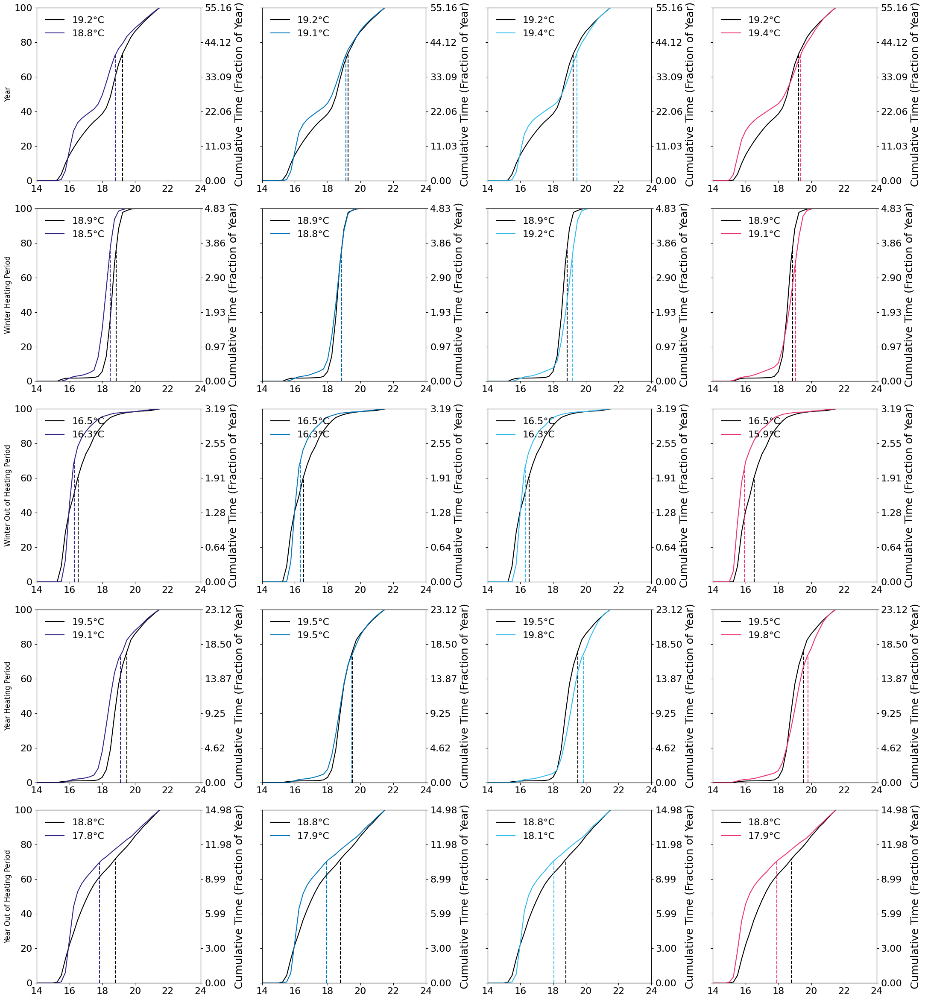

In [31]:

# Usage
monitors_list = [
    monitors_year,
    monitors_winter_heating_period,
    monitors_winter_out_of_heating_period,
    monitors_year_heating_period,
    monitors_year_out_of_heating_period,
]

labels = [
    'Year',
    'Winter Heating Period',
    'Winter Out of Heating Period',
    'Year Heating Period',
    'Year Out of Heating Period',
]

plot_multiple_rows(monitors_list, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names, labels)


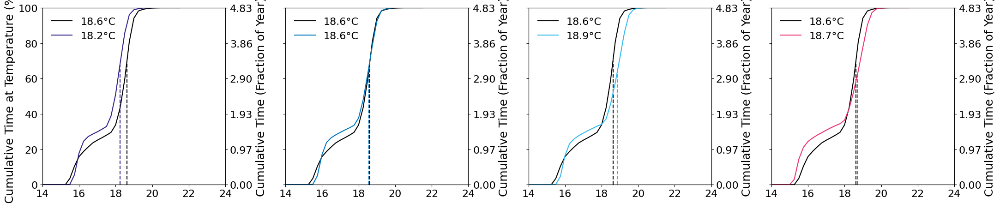

In [18]:
plot_combined_room_only(monitors_winter_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)

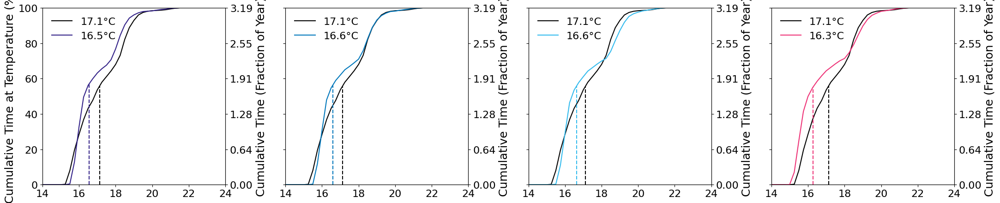

In [19]:
plot_combined_room_only(monitors_winter_out_of_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)

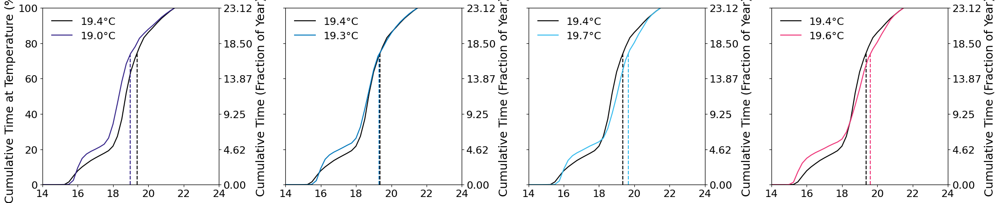

In [20]:
plot_combined_room_only(monitors_year_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)

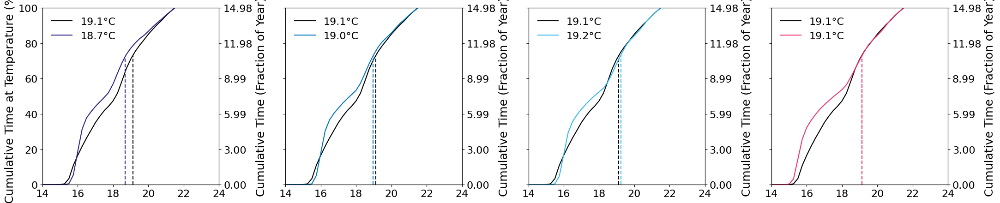

In [21]:
plot_combined_room_only(monitors_year_out_of_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)

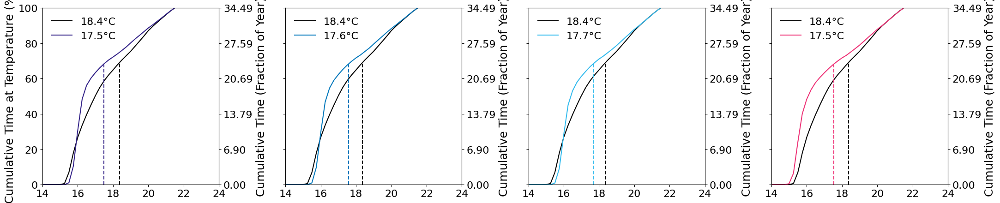

In [14]:
plot_combined_room_only(monitors_year_out_of_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)

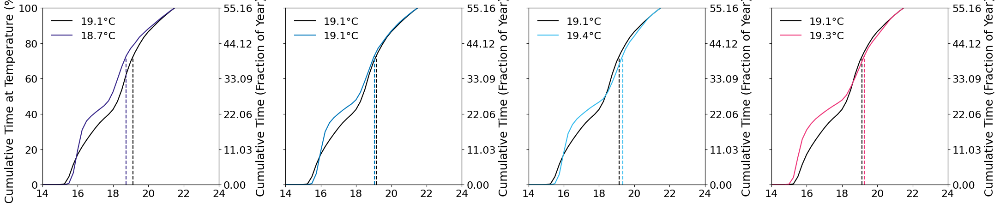

In [15]:
plot_combined_room_only(monitors_year, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)

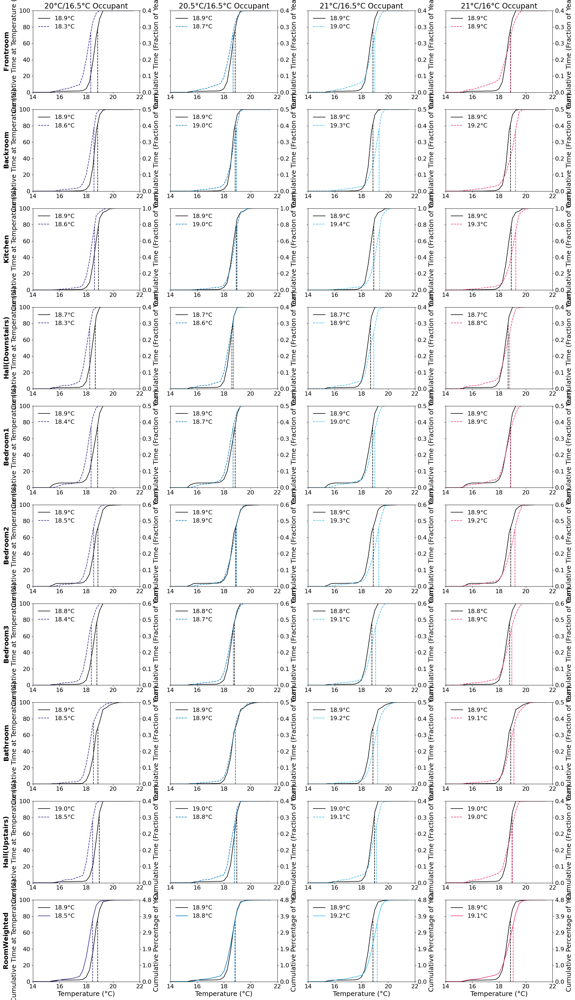

In [48]:
plot_temperature_comparison_with_cumulative(monitors_winter_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)

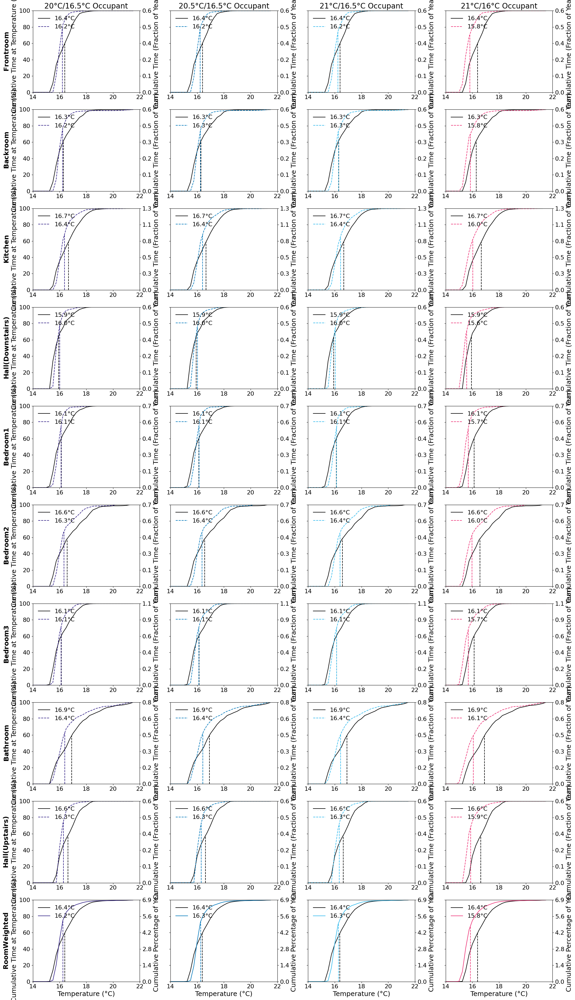

In [49]:
plot_temperature_comparison_with_cumulative(monitors_winter_out_of_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)


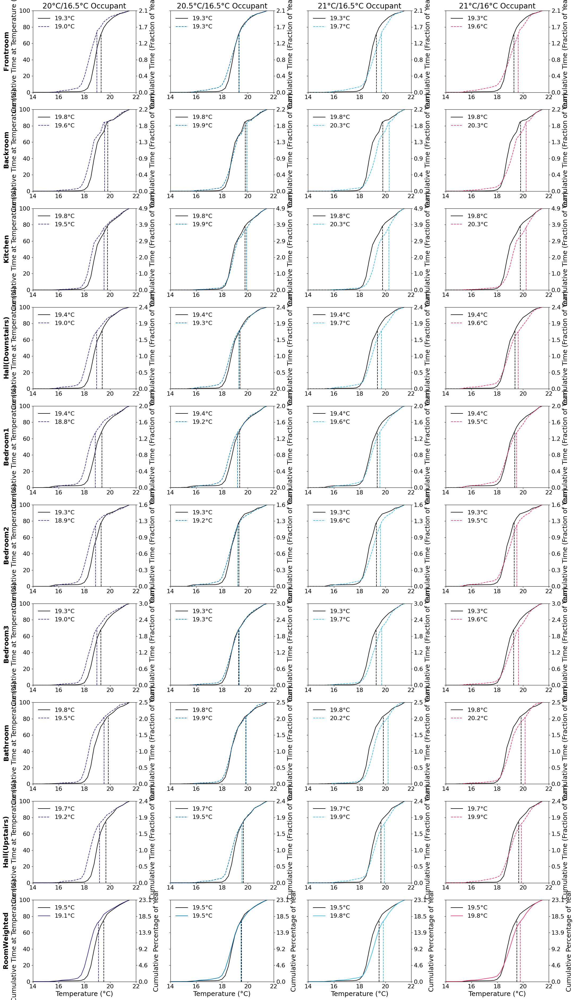

In [50]:
plot_temperature_comparison_with_cumulative(monitors_year_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)


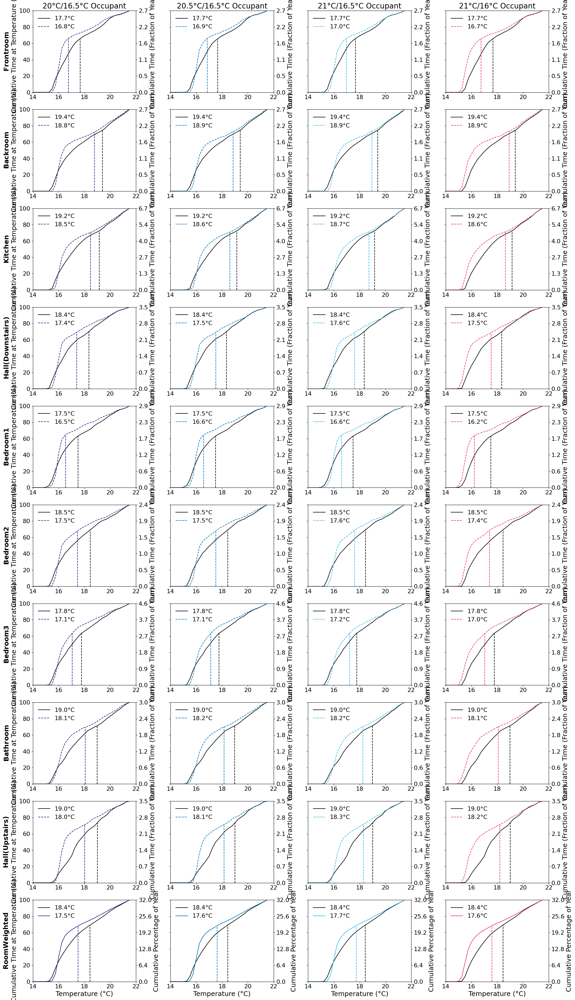

In [51]:
plot_temperature_comparison_with_cumulative(monitors_year_out_of_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)


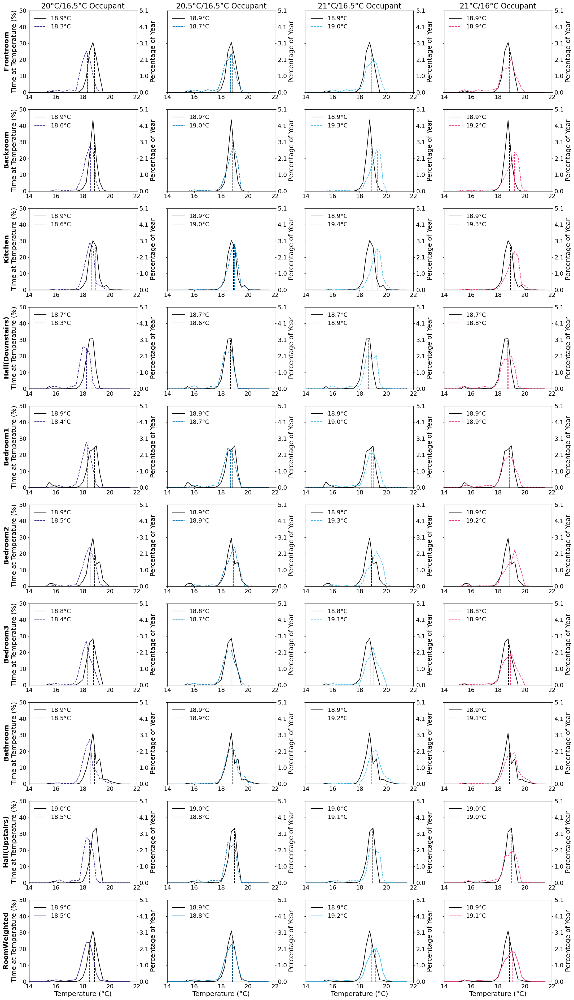

In [73]:
plot_temperature_comparison(monitors_winter_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)


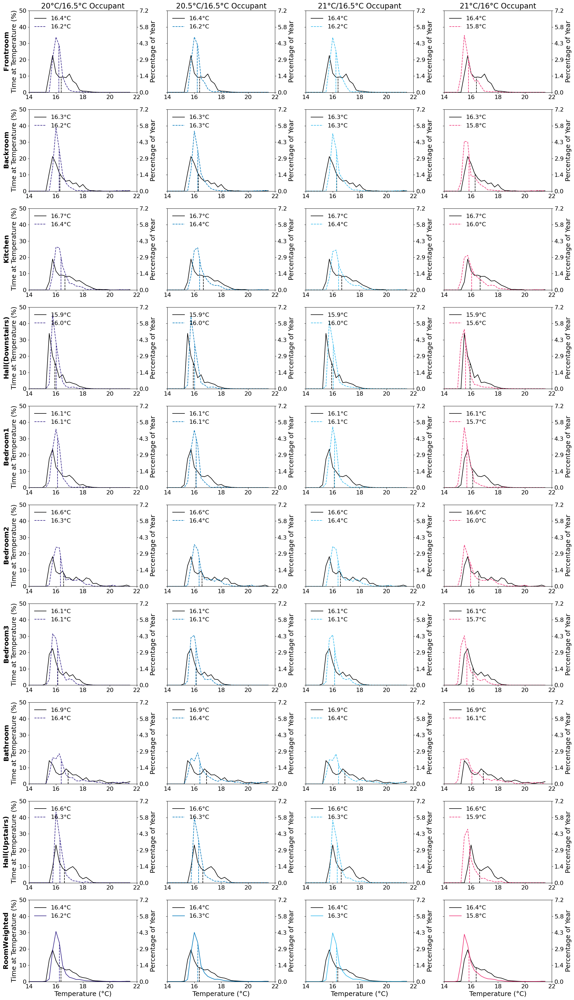

In [74]:
plot_temperature_comparison(monitors_winter_out_of_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)


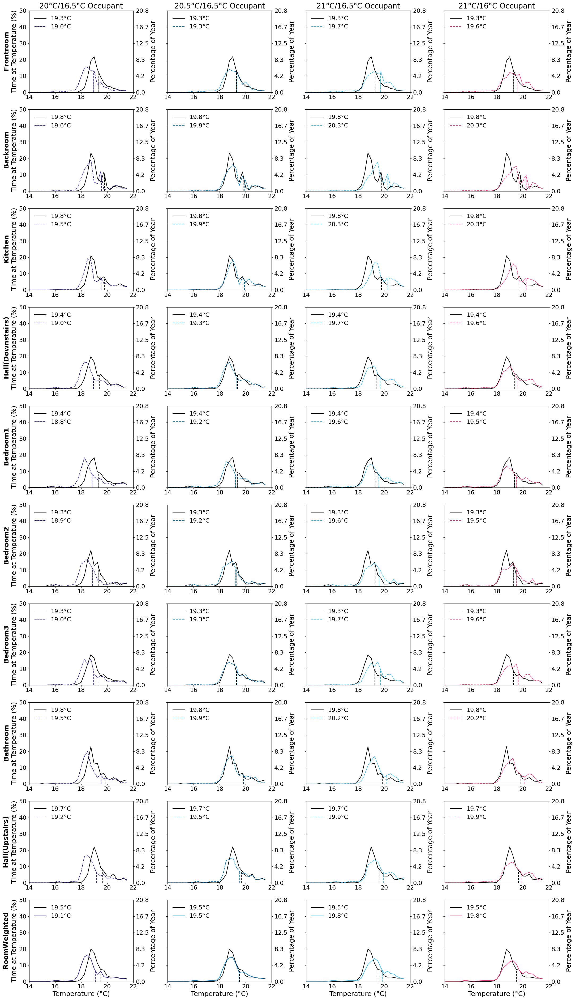

In [75]:
plot_temperature_comparison(monitors_year_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)


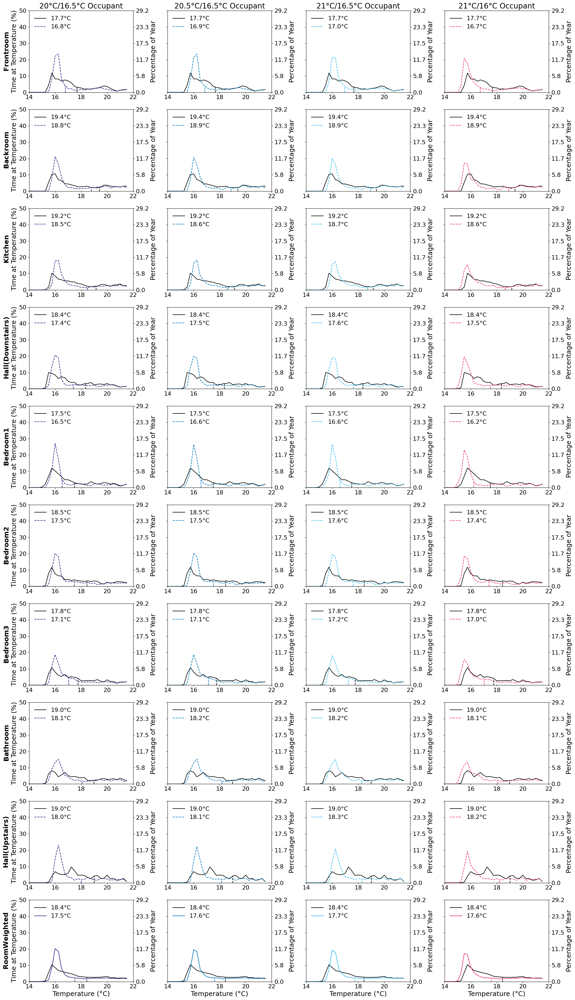

In [76]:
plot_temperature_comparison(monitors_year_out_of_heating_period, rooms, room_areas, total_floor_area, bin_edges, run_colours, run_names)
